In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.seasonal import seasonal_decompose
import logging

logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

from math import sqrt

In [2]:
file_path = 'TIMESERIES_INPUT.csv'
data = pd.read_csv(file_path)

# Display the first few rows of the data to understand its structure
data.head()

,key,4/1/2019,5/1/2019,6/1/2019,7/1/2019,8/1/2019,9/1/2019,10/1/2019,11/1/2019,12/1/2019,...,7/1/2023,8/1/2023,9/1/2023,10/1/2023,11/1/2023,12/1/2023,1/1/2024,2/1/2024,3/1/2024,4/1/2024
0,sku1,6880,19397,9154,6112,3796,1663,7256,8316,13678,...,12699,3148,6483,10745,23608,18038,19647,20523,22254,26407
1,sku2,3776,5882,4136,5074,5238,5112,4270,5870,3494,...,3816,2819,2997,3538,3493,3376,2325,2092,4077,5996
2,sku3,1023,1800,2249,3132,1117,536,347,3245,2846,...,6858,2304,2126,1308,4678,5951,7728,6560,7816,6397
3,sku4,1674,7815,2305,276,222,466,2458,5078,8397,...,375,392,444,1955,5252,7469,6180,5847,8670,6955
4,sku5,0,0,0,0,0,0,0,0,0,...,2943,2552,2451,1521,9026,18957,10365,7417,10388,11932


In [3]:
# Select any 5 SKUs for the analysis
sku = data['key'][:5]
sku

0    sku1
1    sku2
2    sku3
3    sku4
4    sku5
Name: key, dtype: object

In [4]:
skus = data['key']
skus

0      sku1
1      sku2
2      sku3
3      sku4
4      sku5
5      sku6
6      sku7
7      sku8
8      sku9
9     sku10
10    sku11
11    sku12
12    sku13
13    sku14
14    sku15
15    sku16
16    sku17
17    sku18
18    sku19
19    sku20
20    sku21
21    sku22
22    sku23
23    sku24
24    sku25
25    sku26
26    sku27
27    sku28
28    sku29
29    sku30
30    sku31
31    sku32
32    sku33
33    sku34
34    sku35
35    sku36
36    sku37
37    sku38
38    sku39
39    sku40
40    sku41
41    sku42
42    sku43
43    sku44
44    sku45
45    sku46
46    sku47
47    sku48
48    sku49
Name: key, dtype: object

In [5]:
# Set the date range as index
dates = pd.to_datetime(data.columns[1:], format='%m/%d/%Y')
dates

DatetimeIndex(['2019-04-01', '2019-05-01', '2019-06-01', '2019-07-01',
               '2019-08-01', '2019-09-01', '2019-10-01', '2019-11-01',
               '2019-12-01', '2020-01-01', '2020-02-01', '2020-03-01',
               '2020-04-01', '2020-05-01', '2020-06-01', '2020-07-01',
               '2020-08-01', '2020-09-01', '2020-10-01', '2020-11-01',
               '2020-12-01', '2021-01-01', '2021-02-01', '2021-03-01',
               '2021-04-01', '2021-05-01', '2021-06-01', '2021-07-01',
               '2021-08-01', '2021-09-01', '2021-10-01', '2021-11-01',
               '2021-12-01', '2022-01-01', '2022-02-01', '2022-03-01',
               '2022-04-01', '2022-05-01', '2022-06-01', '2022-07-01',
               '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01',
               '2022-12-01', '2023-01-01', '2023-02-01', '2023-03-01',
               '2023-04-01', '2023-05-01', '2023-06-01', '2023-07-01',
               '2023-08-01', '2023-09-01', '2023-10-01', '2023-11-01',
      

In [6]:
def plot_time_series(data, sku):
    plt.figure(figsize=(15, 5))
    plt.plot(dates, data[data['key'] == sku].values.flatten()[1:], label=sku)
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.title(f'Time Series for {sku}')
    plt.legend()
    plt.show()

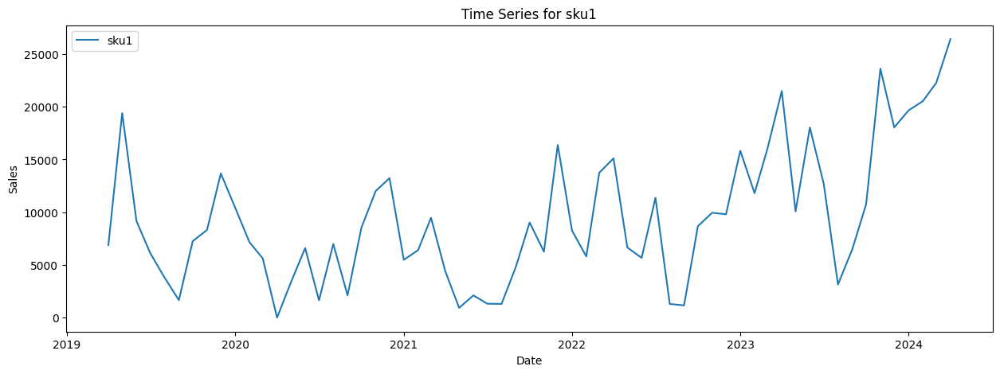

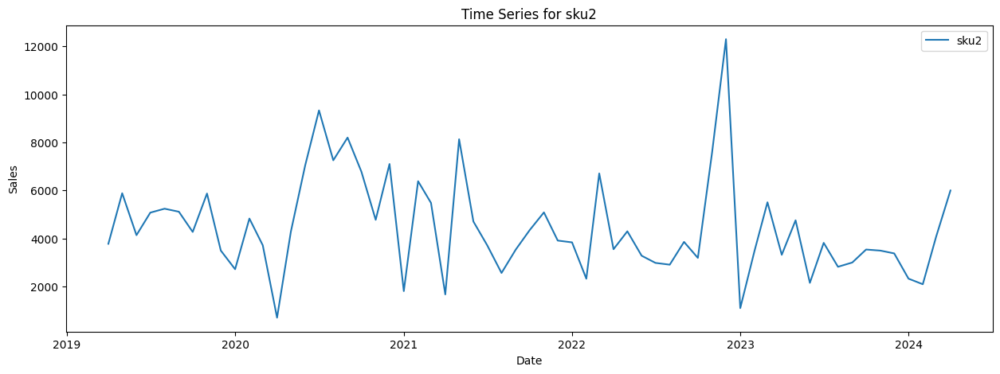

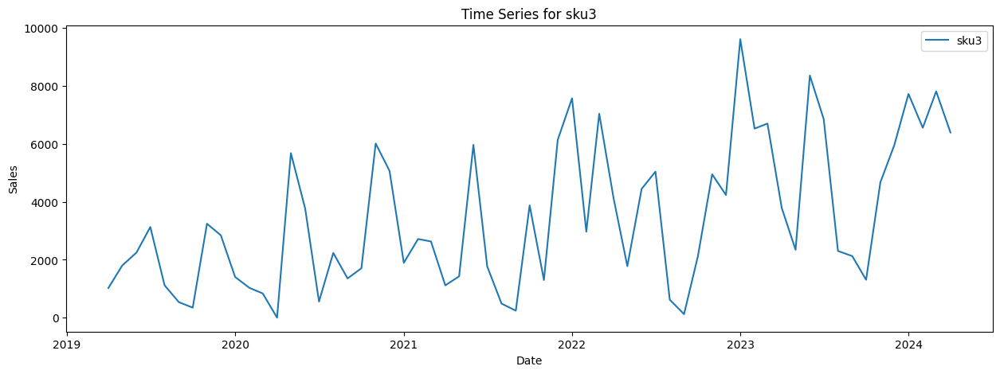

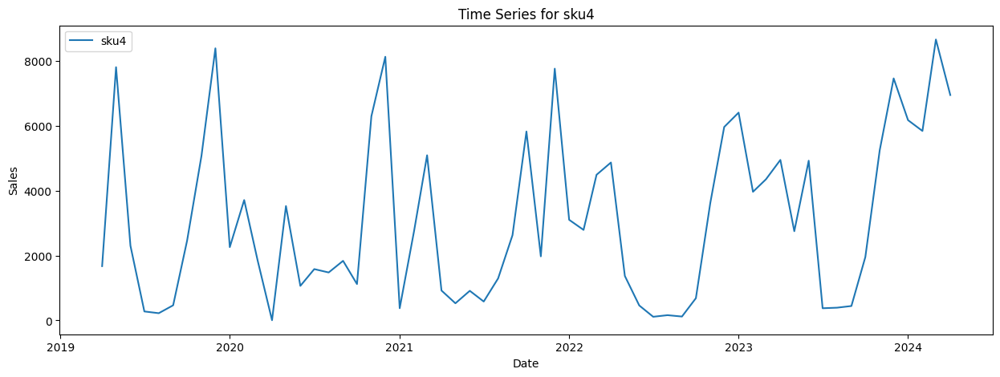

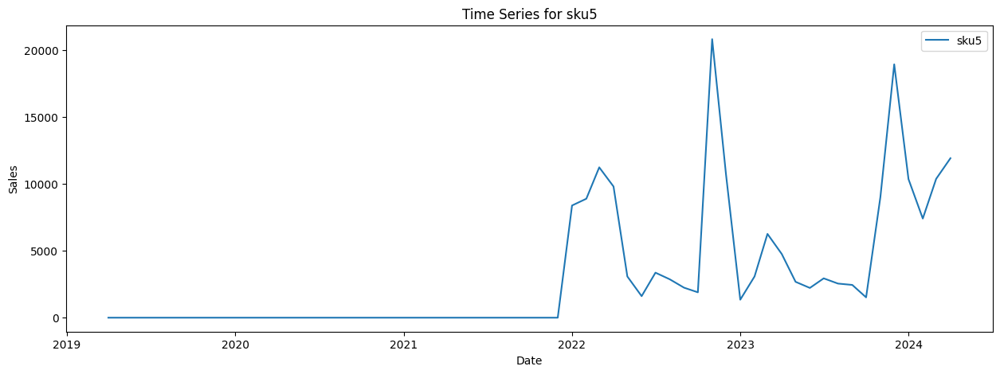

In [7]:
for s in sku:
    plot_time_series(data,s)

In [8]:
# Function to plot rolling statistics
def plot_rolling_statistics(time_series, sku, window=12):
    rolling_mean = time_series.rolling(window=window).mean()
    rolling_var = time_series.rolling(window=window).var()
    
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(time_series, color='blue', label='Original')
    plt.plot(rolling_mean, color='red', label='Rolling Mean')
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.title(f'Rolling Mean for {sku}')
    plt.legend()
    
    plt.subplot(1, 2, 2)
    plt.plot(time_series, color='blue', label='Original')
    plt.plot(rolling_var, color='green', label='Rolling Variance')
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.title(f'Rolling Variance for {sku}')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

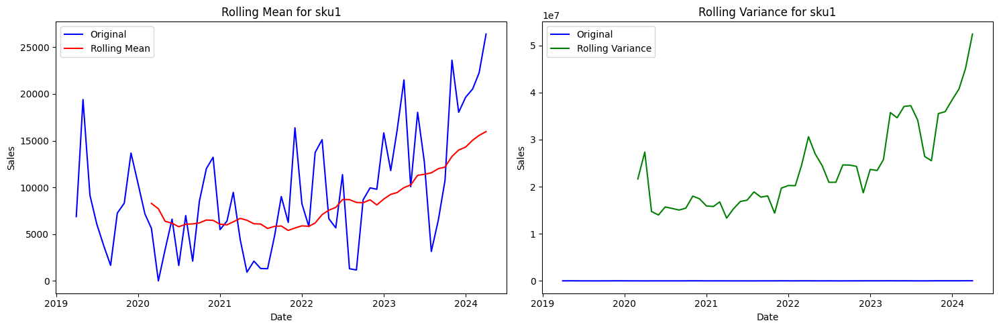

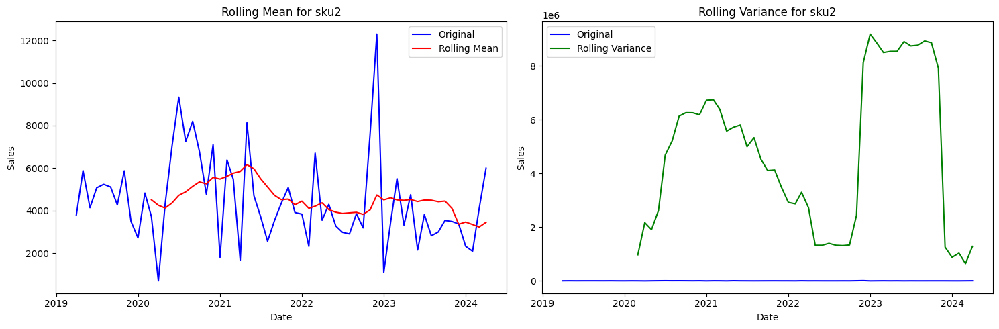

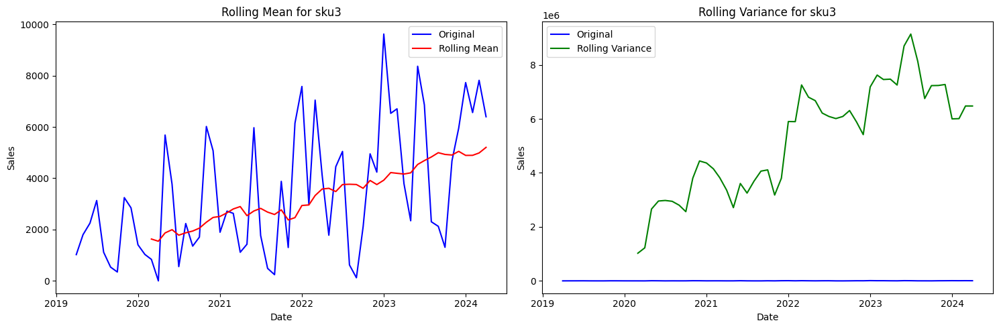

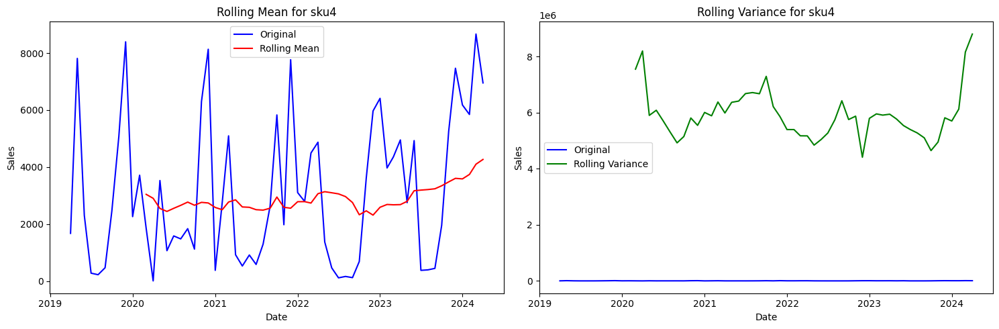

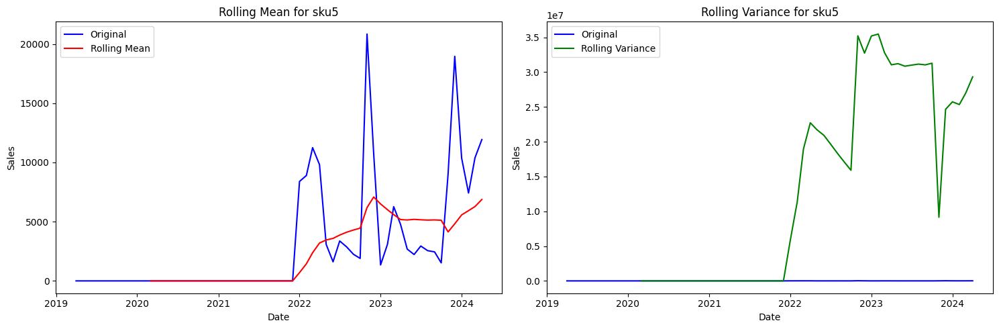

In [10]:
# Plot rolling statistics for the selected SKUs
for sku in sku:
    sku_data = data[data['key'] == sku].values.flatten()[1:]
    sku_series = pd.Series(sku_data, index=dates)
    plot_rolling_statistics(sku_series, sku)

In [13]:
# Function to plot time series
def plot_time_series(data, sku):
    plt.figure(figsize=(15, 5))
    plt.plot(dates, data[data['key'] == sku].values.flatten()[1:], label=sku)
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.title(f'Time Series for {sku}')
    plt.legend()
    plt.show()

In [14]:
# Function to plot rolling statistics
def plot_rolling_statistics(time_series, sku, window=12):
    rolling_mean = time_series.rolling(window=window).mean()
    rolling_var = time_series.rolling(window=window).var()

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 2, 1)
    plt.plot(time_series, color='blue', label='Original')
    plt.plot(rolling_mean, color='red', label='Rolling Mean')
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.title(f'Rolling Mean for {sku}')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(time_series, color='blue', label='Original')
    plt.plot(rolling_var, color='green', label='Rolling Variance')
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.title(f'Rolling Variance for {sku}')
    plt.legend()

    plt.tight_layout()
    plt.show()

In [15]:
# Function to perform seasonal decomposition
def decompose(series, sku):
    decomposition = seasonal_decompose(series, model='additive', period=12)

    plt.figure(figsize=(12, 10))

    plt.subplot(411)
    plt.plot(series.index, decomposition.observed, label='Observed')
    plt.title(f'Observed for {sku}')

    plt.subplot(412)
    plt.plot(series.index, decomposition.trend, label='Trend')
    plt.title(f'Trend for {sku}')

    plt.subplot(413)
    plt.plot(series.index, decomposition.seasonal, label='Seasonal')
    plt.title(f'Seasonal for {sku}')

    plt.subplot(414)
    plt.plot(series.index, decomposition.resid, label='Residual')
    plt.title(f'Residual for {sku}')

    plt.tight_layout()
    plt.show()

In [16]:
# Function to perform differencing and plot the results
def plot_differencing(time_series, sku):
    diff1 = time_series.diff().dropna()
    diff2 = diff1.diff().dropna()

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.plot(time_series, color='blue', label='Original')
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.title(f'Original Time Series for {sku}')
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(diff1, color='red', label='1st Order Differencing')
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.title(f'1st Order Differencing for {sku}')
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(diff2, color='green', label='2nd Order Differencing')
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.title(f'2nd Order Differencing for {sku}')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return diff1, diff2

In [17]:
# Function to perform ADF test and print results
def adf_test(time_series, title):
    result = adfuller(time_series)
    print(f'ADF Test for {title}:')
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'   {key}: {value}')
    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis")
        print("Reject the null hypothesis")
        print("Data has no unit root and is stationary")
    else:
        print("Weak evidence against null hypothesis")
        print("Fail to reject the null hypothesis")
        print("Data has a unit root and is non-stationary")
    print()
    return {
        'ADF_Statistic': result[0],
        'p_value': result[1],
        'Stationary': 'Yes' if result[1] <= 0.05 else 'No'
    }

In [18]:
# Function to fit ARIMA model and calculate RMSE
def fit_arima(train, test, order):
    model = ARIMA(train, order=order)
    results = model.fit()
    forecast = results.forecast(steps=len(test))
    rmse = sqrt(mean_squared_error(test, forecast))
    return rmse

In [19]:
# Function to fit SARIMAX model and calculate RMSE
def fit_sarimax(train, test, order, seasonal_order):
    model = SARIMAX(train, order=order, seasonal_order=seasonal_order)
    results = model.fit()
    forecast = results.forecast(steps=len(test))
    rmse = sqrt(mean_squared_error(test, forecast))
    return rmse

In [20]:
# ARIMA parameter grid
arima_params = [
    (1, 1, 1), (1, 0, 1), (2, 1, 1),
    (2, 2, 1), (2, 2, 2), (2, 0, 1)
]

In [21]:
# SARIMAX parameter grid
sarimax_params = [
    ((0, 0, 0), (0, 0, 1, 12)),
    ((0, 0, 0), (0, 1, 0, 12)),
    ((0, 0, 0), (1, 0, 0, 12)),
    ((0, 0, 0), (0, 1, 1, 12)),
    ((0, 0, 0), (1, 1, 1, 12)),
    ((0, 0, 0), (1, 1, 0, 12))
]

In [22]:
# Initialize results DataFrame
results_df = pd.DataFrame()

In [23]:
sku_data = data[data['key'] == 'sku1'].values.flatten()[1:]
sku_data

array([6880, 19397, 9154, 6112, 3796, 1663, 7256, 8316, 13678, 10446,
       7167, 5620, 0, 3345, 6602, 1646, 6984, 2116, 8537, 12011, 13228,
       5485, 6402, 9476, 4401, 932, 2114, 1326, 1303, 4803, 9025, 6259,
       16379, 8246, 5808, 13739, 15106, 6655, 5673, 11369, 1300, 1166,
       8672, 9949, 9804, 15833, 11804, 16028, 21495, 10079, 18030, 12699,
       3148, 6483, 10745, 23608, 18038, 19647, 20523, 22254, 26407],
      dtype=object)

In [24]:
sku_series = pd.Series(sku_data, index=dates)
sku_series

2019-04-01     6880
2019-05-01    19397
2019-06-01     9154
2019-07-01     6112
2019-08-01     3796
              ...  
2023-12-01    18038
2024-01-01    19647
2024-02-01    20523
2024-03-01    22254
2024-04-01    26407
Length: 61, dtype: object

2024-07-25 12:28:48,801 - INFO - Processing sku1...


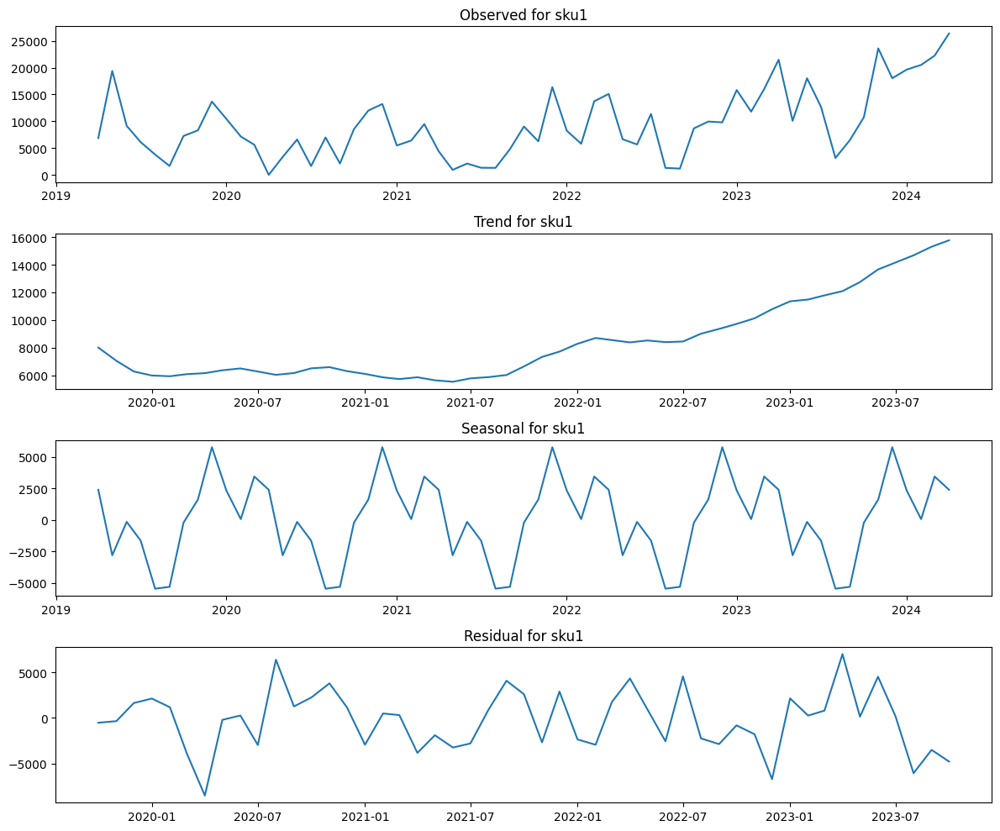

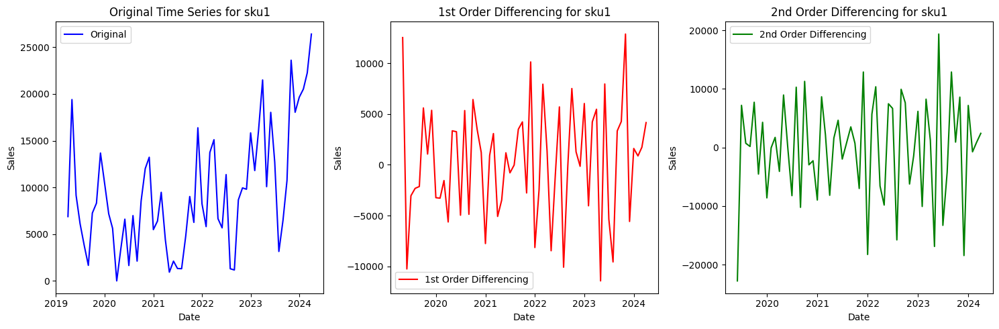

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:28:50,051 - INFO - ARIMA(1, 1, 1) fitted successfully for sku1
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_m

ADF Test for Original Series for sku1:
ADF Statistic: 1.5833737513531976
p-value: 0.9978068283595484
Critical Values:
   1%: -3.5714715250448363
   5%: -2.922629480573571
   10%: -2.5993358475635153
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku1:
ADF Statistic: -4.911625391685144
p-value: 3.310207394638627e-05
Critical Values:
   1%: -3.5714715250448363
   5%: -2.922629480573571
   10%: -2.5993358475635153
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku1:
ADF Statistic: -6.044666560464832
p-value: 1.3206018554798298e-07
Critical Values:
   1%: -3.5778480370438146
   5%: -2.925338105429433
   10%: -2.6007735310095064
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:28:50,239 - INFO - ARIMA(2, 2, 1) fitted successfully for sku1
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_m

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.00840D+01    |proj g|=  2.69678D-01

At iterate    5    f=  1.00141D+01    |proj g|=  4.89104D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      5      9      1     0     0   4.891D-05   1.001D+01
  F =   10.014097231872061     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 v

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      3      5      1     0     0   3.708D-06   9.990D+00
  F =   9.9902264912003726     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.85579D+00    |proj g|=  1.94183D-01

At iterate    5    f=  7.81162D+00    |proj g|=  3.41501D-05

At iterate   10    f=  7.81162D+00    |proj g|=  1.24529D-03

At iterate   15    f=  7.81121D+00    |proj g|=  1.45210D-02

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:47

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.81476D+00    |proj g|=  9.28771D-02

At iterate    5    f=  7.80748D+00    |proj g|=  4.06544D-05

At iterate   10    f=  7.80746D+00    |proj g|=  4.27845D-03

At iterate   15    f=  7.80591D+00    |proj g|=  2.36989D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     18     23      1     0     0   1.387D-06   7.805D+00
  F =   7.8052675827333937     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  results_df.loc[sku, 'May_2024_Forecast'] = forecast[1]  # Take the second prediction (May)
2024-07-25 12:28:51,470 - INFO - Processing sku2...



At iterate    5    f=  1.00023D+01    |proj g|=  6.85491D-05

At iterate   10    f=  1.00022D+01    |proj g|=  2.87289D-03

At iterate   15    f=  1.00000D+01    |proj g|=  2.76332D-02

At iterate   20    f=  9.97286D+00    |proj g|=  1.29801D-02

At iterate   25    f=  9.97057D+00    |proj g|=  2.42085D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     26     32      1     0     0   2.483D-07   9.971D+00
  F =   9.9705660278709551     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Forecast after differencing adjustment: 2024-05-01   -4156.436321
2024-06-01    4258.026011
Freq: MS, Name: predi

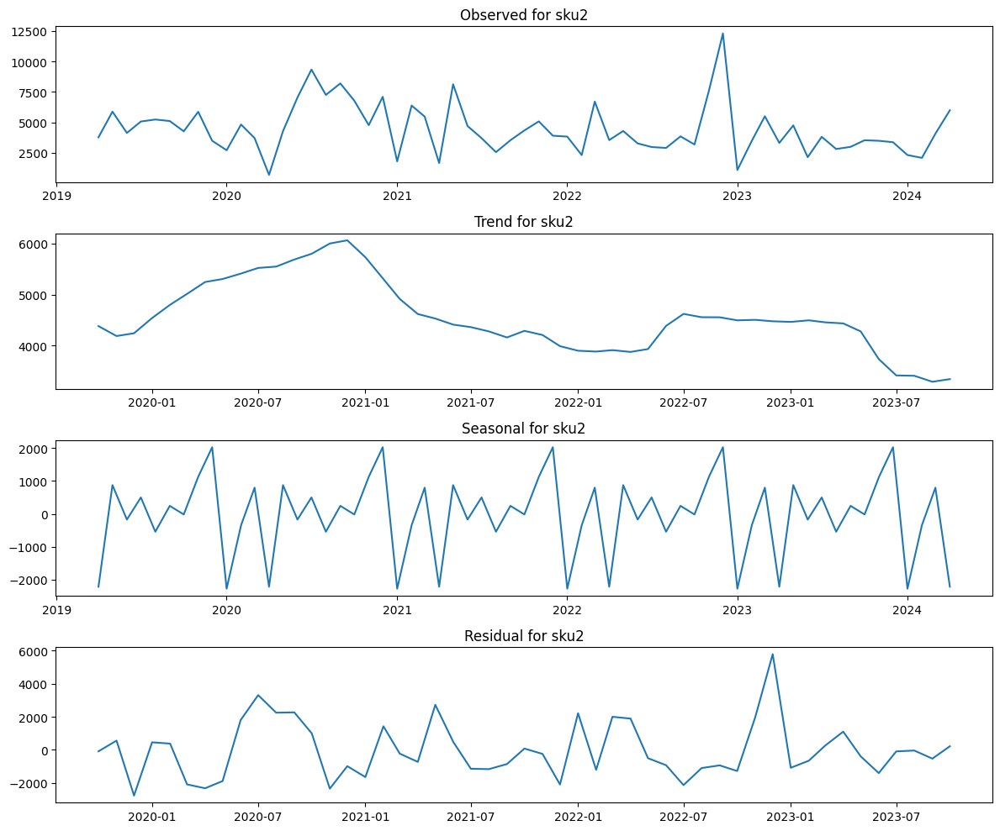

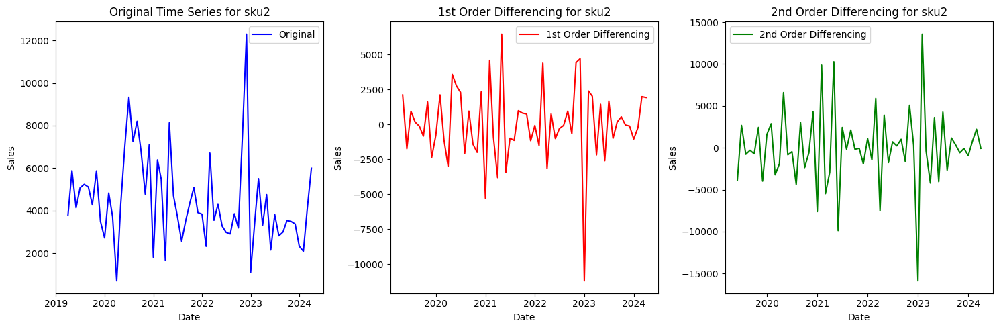

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:28:52,643 - INFO - ARIMA(1, 1, 1) fitted successfully for sku2
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_m

ADF Test for Original Series for sku2:
ADF Statistic: -6.491482935578945
p-value: 1.2235487560448496e-08
Critical Values:
   1%: -3.5443688564814813
   5%: -2.9110731481481484
   10%: -2.5931902777777776
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 1st Differenced Series for sku2:
ADF Statistic: -9.252146355080844
p-value: 1.4823598286676937e-15
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku2:
ADF Statistic: -7.811108297641481
p-value: 7.065958462138416e-12
Critical Values:
   1%: -3.5552728880540942
   5%: -2.9157312396694217
   10%: -2.5956695041322315
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:28:52,821 - INFO - ARIMA(2, 2, 1) fitted successfully for sku2
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_m

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.95335D+00    |proj g|=  7.84225D-01

At iterate    5    f=  9.74570D+00    |proj g|=  7.40300D-05

At iterate   10    f=  9.74568D+00    |proj g|=  2.56812D-03

At iterate   15    f=  9.74340D+00    |proj g|=  2.34011D-02

At iterate   20    f=  9.69755D+00    |proj g|=  1.03092D-04

At iterate   25    f=  9.69722D+00    |proj g|=  2.41415D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     28     43      1     0     0   

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.45481D+00    |proj g|=  3.34194D-02

At iterate    5    f=  9.44892D+00    |proj g|=  1.18131D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      5      7      1     0     0   1.181D-05   9.449D+00
  F =   9.4489202675025545     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 v

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.



At iterate    5    f=  1.44418D+01    |proj g|=  4.09822D-01

At iterate   10    f=  1.38497D+01    |proj g|=  7.56271D-02

At iterate   15    f=  9.06803D+00    |proj g|=  5.13561D-03

At iterate   20    f=  7.30402D+00    |proj g|=  1.52172D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     25      1     0     0   3.672D-06   7.273D+00
  F =   7.2732992939071233     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency infor

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.37585D+00    |proj g|=  3.11541D-01

At iterate    5    f=  7.27118D+00    |proj g|=  1.90096D-03

At iterate   10    f=  7.27047D+00    |proj g|=  3.91796D-02

At iterate   15    f=  7.25857D+00    |proj g|=  2.33813D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     19     25      1     0     0   2.748D-06   7.258D+00
  F =   7.2582949570213700     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  results_df.loc[sku, 'May_2024_Forecast'] = forecast[1]  # Take the second prediction (May)
2024-07-25 12:28:54,182 - INFO - Processing sku3...


Forecast after differencing adjustment: 2024-05-01    4300.687589
2024-06-01    4654.640172
Freq: MS, Name: predicted_mean, dtype: float64


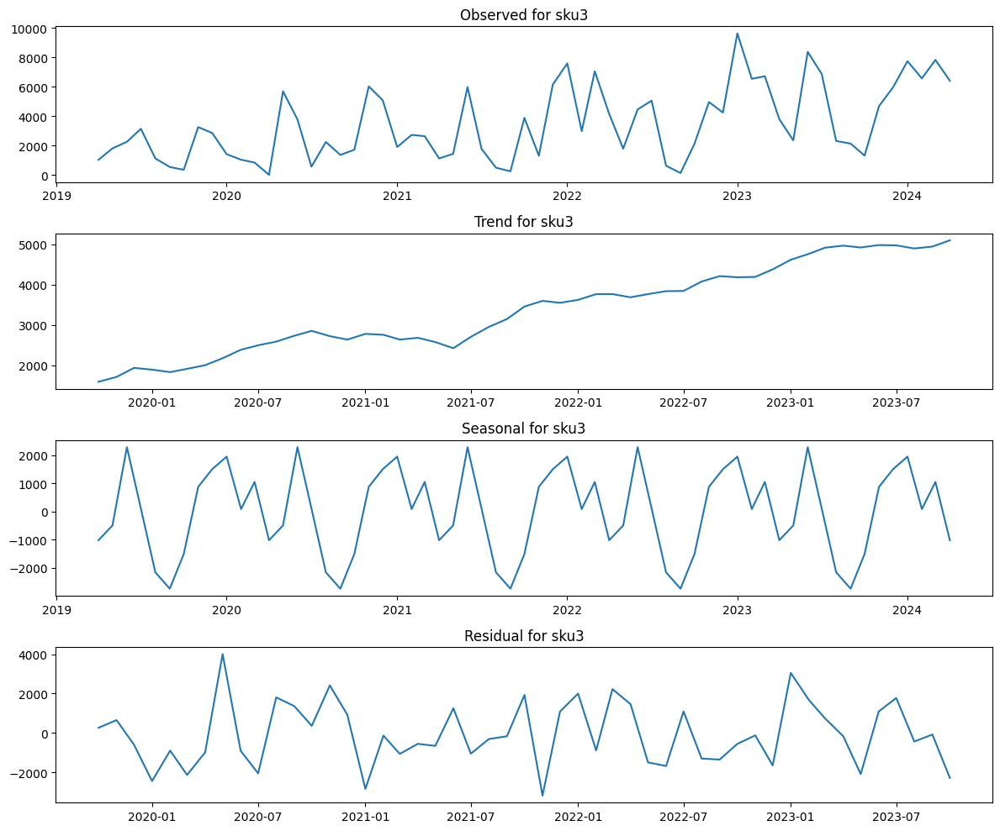

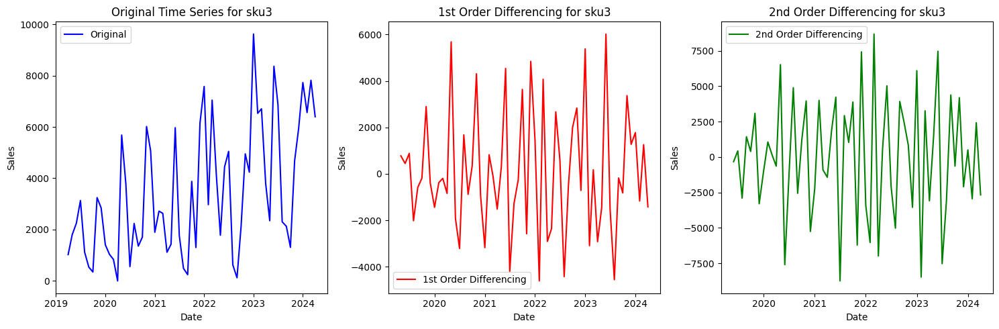

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:28:55,251 - INFO - ARIMA(1, 1, 1) fitted successfully for sku3
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_m

ADF Test for Original Series for sku3:
ADF Statistic: -0.37978220323121487
p-value: 0.9134200916561523
Critical Values:
   1%: -3.5714715250448363
   5%: -2.922629480573571
   10%: -2.5993358475635153
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku3:
ADF Statistic: -6.445605695699658
p-value: 1.568714280329005e-08
Critical Values:
   1%: -3.5745892596209488
   5%: -2.9239543084490744
   10%: -2.6000391840277777
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku3:
ADF Statistic: -5.296010885178773
p-value: 5.580802564468968e-06
Critical Values:
   1%: -3.5778480370438146
   5%: -2.925338105429433
   10%: -2.6007735310095064
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:28:55,472 - INFO - ARIMA(2, 2, 1) fitted successfully for sku3
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_m

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.45071D+00    |proj g|=  3.69734D-01

At iterate    5    f=  9.30783D+00    |proj g|=  7.78552D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      5      7      1     0     0   7.786D-05   9.308D+00
  F =   9.3078305175815483     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 v

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.30349D+00    |proj g|=  5.69284D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      4      6      1     0     0   6.415D-05   9.301D+00
  F =   9.3008912467583436     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.7

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible


At iterate   15    f=  7.54828D+00    |proj g|=  5.56729D-03

At iterate   20    f=  7.54221D+00    |proj g|=  7.62423D-03

At iterate   25    f=  7.47624D+00    |proj g|=  5.01424D-04


/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  results_df.loc[sku, 'May_2024_Forecast'] = forecast[1]  # Take the second prediction (May)
2024-07-25 12:28:56,958 - INFO - Processing sku4...



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     31      1     0     0   9.222D-06   7.476D+00
  F =   7.4761995408645179     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Forecast after differencing adjustment: 2024-05-01     111.691485
2024-06-01    2746.696465
Freq: MS, Name: predicted_mean, dtype: float64


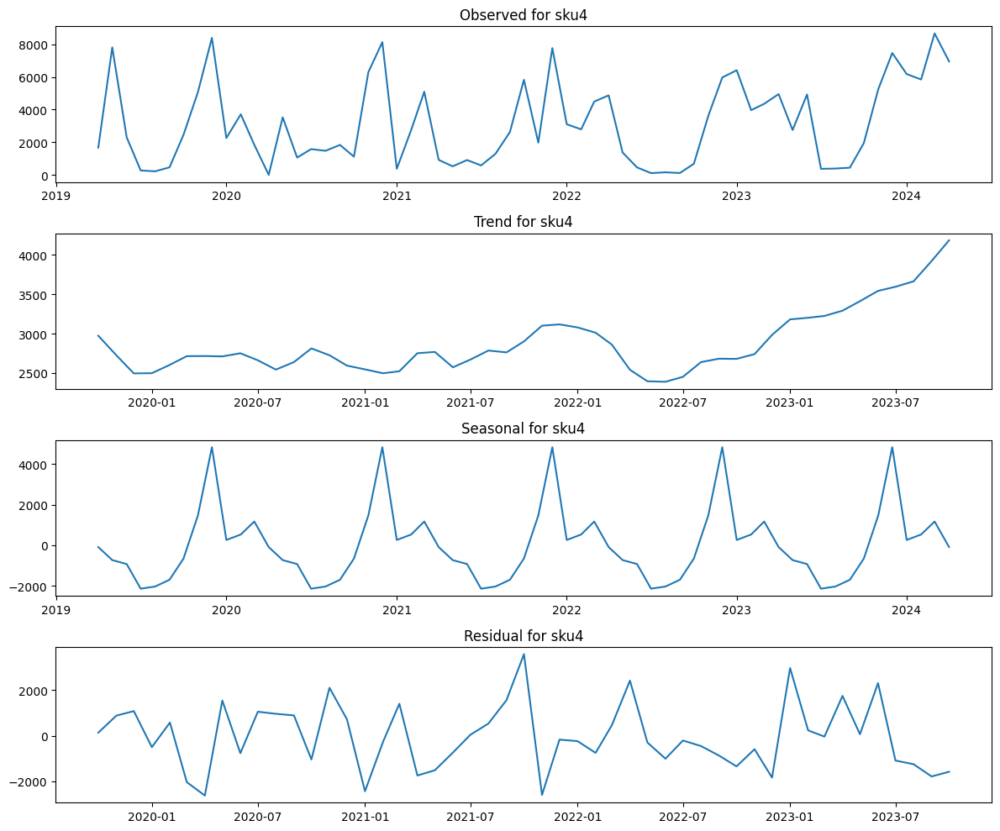

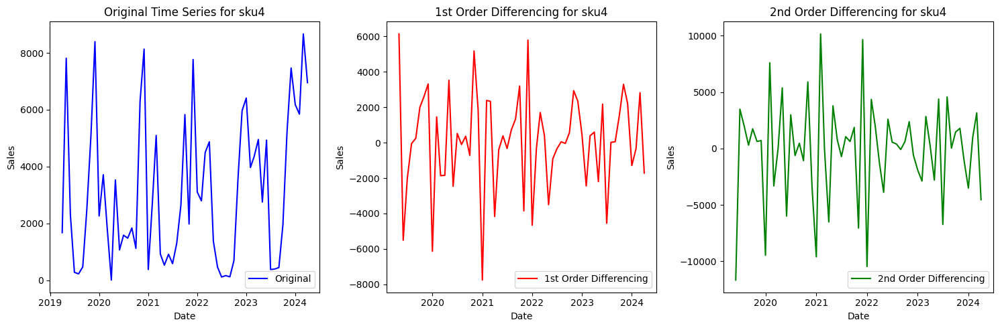

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:28:58,130 - INFO - ARIMA(1, 1, 1) fitted successfully for sku4
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_m

ADF Test for Original Series for sku4:
ADF Statistic: -0.0924867010981732
p-value: 0.9501817641189002
Critical Values:
   1%: -3.5714715250448363
   5%: -2.922629480573571
   10%: -2.5993358475635153
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku4:
ADF Statistic: -7.1222929660764285
p-value: 3.695698253644753e-10
Critical Values:
   1%: -3.5714715250448363
   5%: -2.922629480573571
   10%: -2.5993358475635153
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku4:
ADF Statistic: -5.973744497964805
p-value: 1.9090767188786968e-07
Critical Values:
   1%: -3.5778480370438146
   5%: -2.925338105429433
   10%: -2.6007735310095064
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:28:58,289 - INFO - ARIMA(2, 1, 1) fitted successfully for sku4
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_m

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.51566D+00    |proj g|=  2.62889D-01

At iterate    5    f=  9.49185D+00    |proj g|=  6.14348D-04

At iterate   10    f=  9.49179D+00    |proj g|=  7.77124D-03

At iterate   15    f=  9.48469D+00    |proj g|=  1.15511D-01

At iterate   20    f=  9.31175D+00    |proj g|=  4.76225D-02

At iterate   25    f=  9.30895D+00    |proj g|=  1.22084D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     26     28      1     0     0   

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: 

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.31809D+00    |proj g|=  8.43890D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      3      7      1     0     0   2.660D-06   7.304D+00
  F =   7.3041985507420115     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.3

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.25476D+00    |proj g|=  3.19658D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      4      6      1     0     0   3.559D-05   7.254D+00
  F =   7.2535936081327659     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.6

/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  results_df.loc[sku, 'May_2024_Forecast'] = forecast[1]  # Take the second prediction (May)
2024-07-25 12:28:59,664 - INFO - Processing sku5...



At iterate   20    f=  7.41011D+00    |proj g|=  4.09736D-02

At iterate   25    f=  7.39004D+00    |proj g|=  5.59526D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     30      1     0     0   1.673D-05   7.390D+00
  F =   7.3900448112571819     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Forecast after differencing adjustment: 2024-05-01   -215.050415
2024-06-01    -99.788498
Freq: MS, Name: predicted_mean, dtype: float64


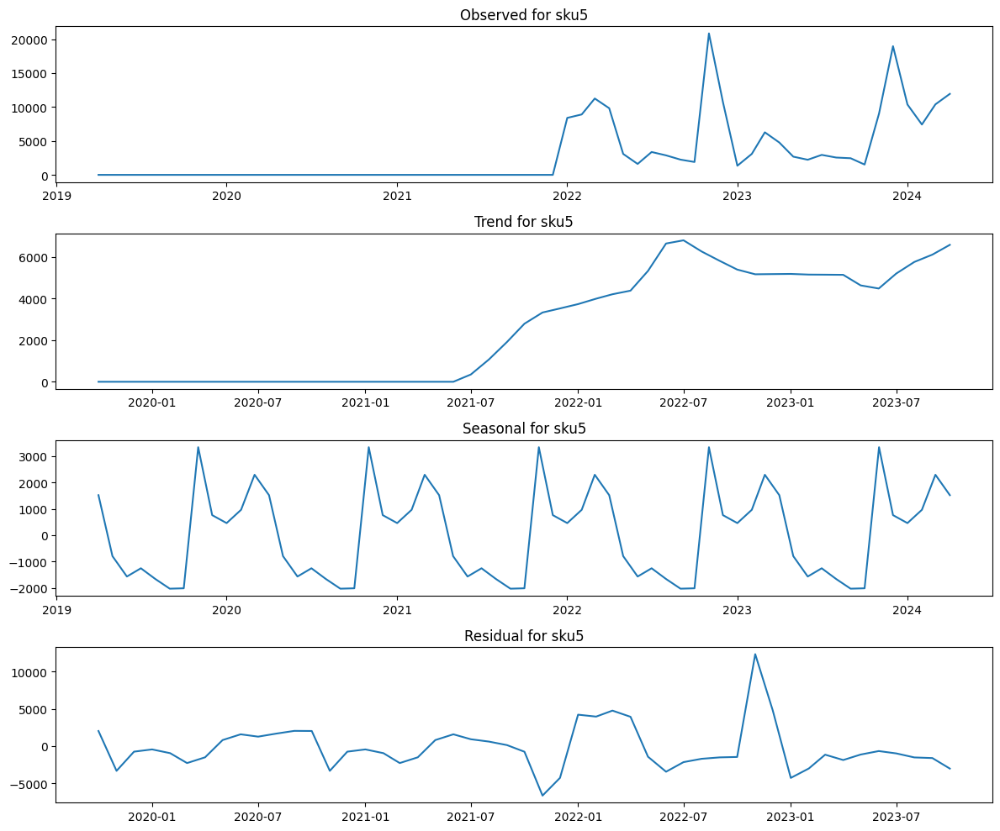

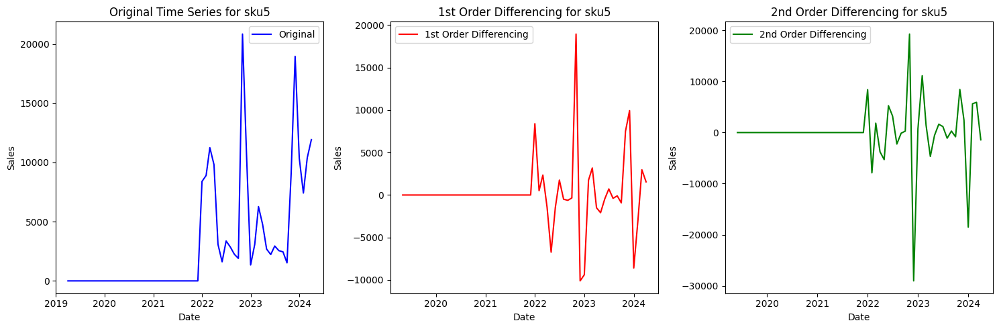

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
2024-07-25 12:29:00,795 - INFO - ARIMA(1, 1, 1) fitted successfully for sku5
/home/pratik/.local/lib/python3.10/site-package

ADF Test for Original Series for sku5:
ADF Statistic: -1.9702743968830185
p-value: 0.29975686506649923
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku5:
ADF Statistic: -3.6595074528064155
p-value: 0.0047201435795144915
Critical Values:
   1%: -3.5714715250448363
   5%: -2.922629480573571
   10%: -2.5993358475635153
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku5:
ADF Statistic: -4.656264235303855
p-value: 0.00010159959324715907
Critical Values:
   1%: -3.5778480370438146
   5%: -2.925338105429433
   10%: -2.6007735310095064
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:01,032 - INFO - ARIMA(2, 2, 1) fitted successfully for sku5
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_m

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.75159D+00    |proj g|=  3.22440D-02

At iterate    5    f=  9.74989D+00    |proj g|=  9.55635D-04

At iterate   10    f=  9.74950D+00    |proj g|=  1.48877D-02

At iterate   15    f=  9.70507D+00    |proj g|=  9.38510D-02

At iterate   20    f=  9.61188D+00    |proj g|=  5.83468D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     23     32      1     0     0   1.191D-06   9.610D+00
  F =   9.6097608423675034     

CONVERG

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: 

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.66393D+00    |proj g|=  5.39675D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      2      6      1     0     0   9.274D-06   7.651D+00
  F =   7.6505925217710660     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.6

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.



At iterate   20    f=  7.82483D+00    |proj g|=  5.19232D-04

At iterate   25    f=  7.59429D+00    |proj g|=  2.21512D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     26      1     0     0   2.215D-06   7.594D+00
  F =   7.5942851216023399     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.65016D+00    |proj g|=  1.46457D-01

At iterate    5    f=  7.56344D+00    |proj g|=  2.27769D-03

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473

Forecast after differencing adjustment: 2024-05-01   -2145.220768
2024-06-01   -1429.932890
Freq: MS, Name: predicted_mean, dtype: float64


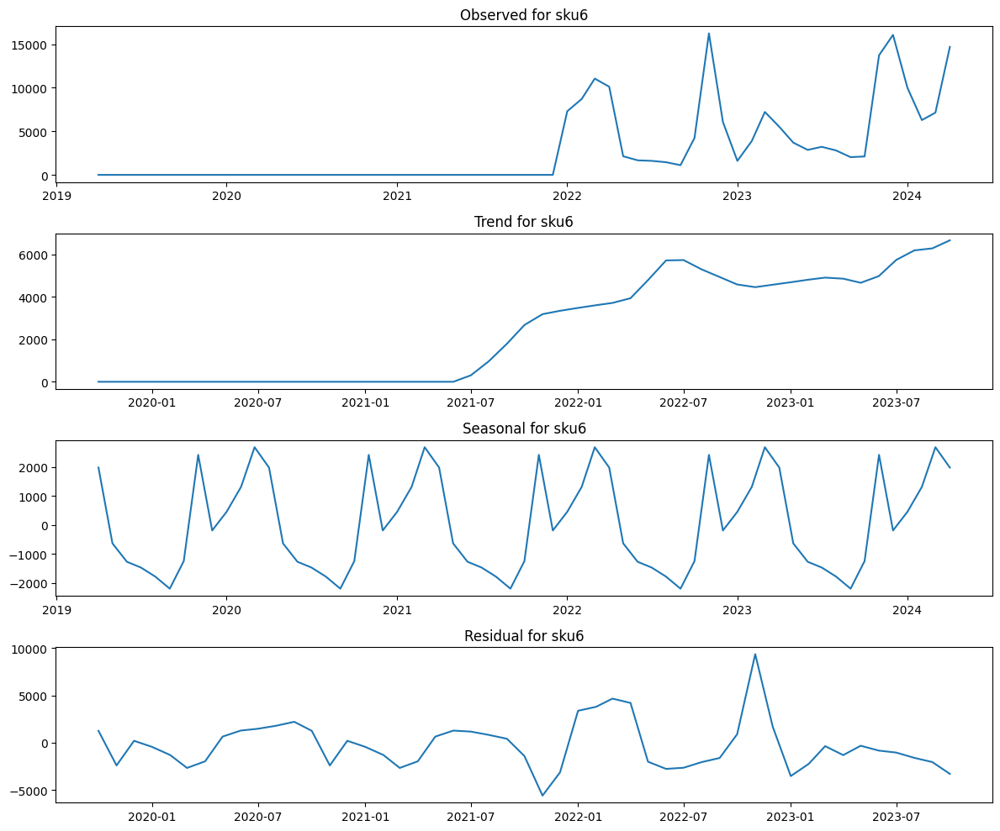

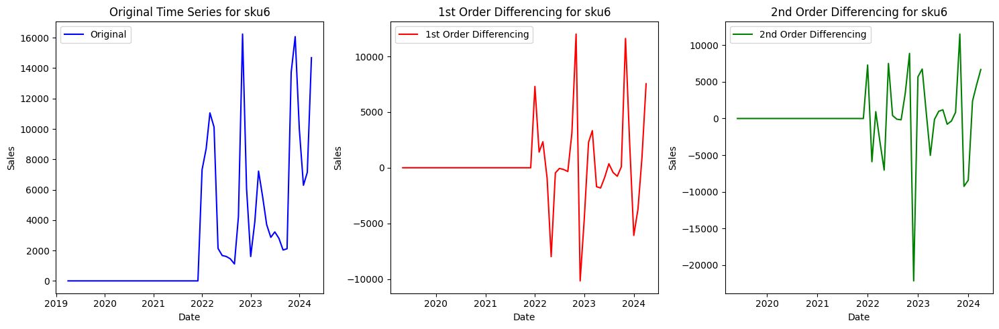

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
2024-07-25 12:29:03,592 - INFO - ARIMA(1, 1, 1) fitted successfully for sku6
/home/pratik/.local/lib/python3.10/site-package

ADF Test for Original Series for sku6:
ADF Statistic: 0.5777920293472538
p-value: 0.987055255644809
Critical Values:
   1%: -3.5714715250448363
   5%: -2.922629480573571
   10%: -2.5993358475635153
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku6:
ADF Statistic: -4.160389889749034
p-value: 0.0007683509769437105
Critical Values:
   1%: -3.5714715250448363
   5%: -2.922629480573571
   10%: -2.5993358475635153
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku6:
ADF Statistic: -4.759769263784206
p-value: 6.488891576150683e-05
Critical Values:
   1%: -3.5778480370438146
   5%: -2.925338105429433
   10%: -2.6007735310095064
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:03,749 - INFO - ARIMA(2, 1, 1) fitted successfully for sku6
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_m

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.56007D+00    |proj g|=  1.18429D-01

At iterate    5    f=  9.48990D+00    |proj g|=  1.29234D-04

At iterate   10    f=  9.48976D+00    |proj g|=  9.08477D-03

At iterate   15    f=  9.47409D+00    |proj g|=  9.89307D-02

At iterate   20    f=  9.37037D+00    |proj g|=  1.25037D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     24     27      1     0     0   3.846D-07   9.370D+00
  F =   9.3702004895101840     

CONVERG

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.



At iterate    5    f=  9.38534D+00    |proj g|=  1.63087D-03

At iterate   10    f=  9.38459D+00    |proj g|=  2.50448D-02

At iterate   15    f=  9.37039D+00    |proj g|=  1.10154D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     18     22      1     0     0   1.210D-07   9.370D+00
  F =   9.3702004895185649     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.11543D+01    |proj g|=  2.36035D+00

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.



At iterate   15    f=  7.48171D+00    |proj g|=  3.27570D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     19     20      1     0     0   3.740D-06   7.382D+00
  F =   7.3820317758614902     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.17058D+01    |proj g|=  2.25131D+00

At iterate    5    f=  1.69804D+01    |proj g|=  1.52260D-01

At iterate   10    f=  9.51033D+00    |proj g|=  1.56691D-01

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473

Forecast after differencing adjustment: 2024-05-01   -1642.967287
2024-06-01   -3580.633574
Freq: MS, Name: predicted_mean, dtype: float64


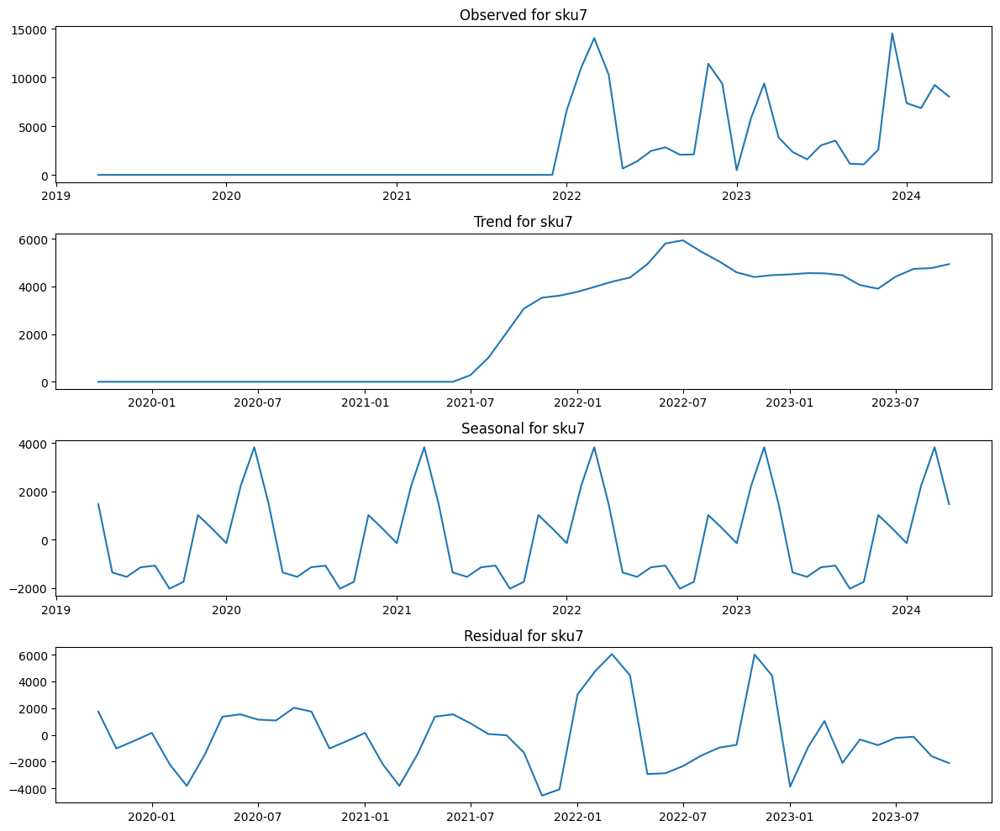

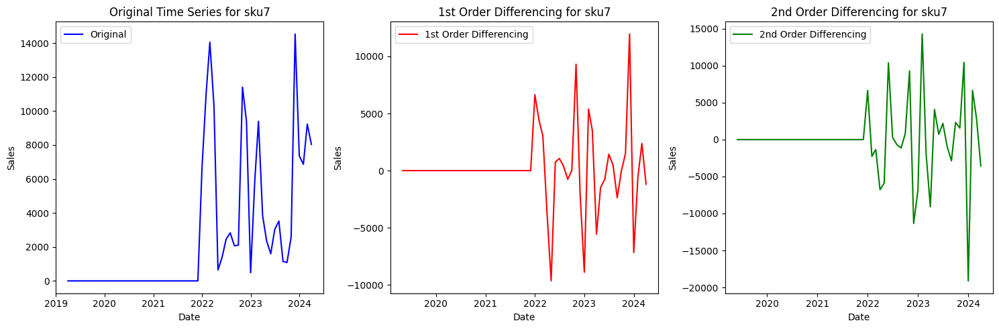

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:06,073 - INFO - ARIMA(1, 1, 1) fitted successfully for sku7
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_m

ADF Test for Original Series for sku7:
ADF Statistic: -2.200768820613383
p-value: 0.20596653766455897
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku7:
ADF Statistic: -4.8138878063065755
p-value: 5.1154872169893644e-05
Critical Values:
   1%: -3.560242358792829
   5%: -2.9178502070837
   10%: -2.5967964150943397
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku7:
ADF Statistic: -4.635846302189368
p-value: 0.00011088182349481898
Critical Values:
   1%: -3.5778480370438146
   5%: -2.925338105429433
   10%: -2.6007735310095064
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:06,293 - INFO - ARIMA(2, 2, 1) fitted successfully for sku7
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_m

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.39880D+00    |proj g|=  2.27643D-02

At iterate    5    f=  9.39831D+00    |proj g|=  1.65964D-03

At iterate   10    f=  9.39766D+00    |proj g|=  2.54979D-02

At iterate   15    f=  9.37907D+00    |proj g|=  2.68867D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     18     22      1     0     0   6.047D-07   9.378D+00
  F =   9.3783844698583696     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.39375D+00    |proj g|=  1.64840D-02

At iterate    5    f=  9.39350D+00    |proj g|=  1.63250D-03

At iterate   10    f=  9.39286D+00    |proj g|=  2.52620D-02

At iterate   15    f=  9.37874D+00    |proj g|=  1.82259D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     18     22      1     0     0   2.248D-06   9.378D+00
  F =   9.3783844709979487     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.



At iterate    5    f=  1.08627D+01    |proj g|=  1.09140D-02

At iterate   10    f=  8.02309D+00    |proj g|=  9.33798D-03

At iterate   15    f=  7.39574D+00    |proj g|=  1.59856D-03

At iterate   20    f=  7.38172D+00    |proj g|=  1.92519D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     29      1     0     0   1.925D-05   7.382D+00
  F =   7.3817166862232702     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency infor


At iterate   10    f=  7.36207D+00    |proj g|=  4.45172D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     11     17      1     0     0   3.165D-06   7.362D+00
  F =   7.3620704215844306     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Forecast after differencing adjustment: 2024-05-01   -589.706515
2024-06-01    709.537491
Freq: MS, Name: predicted_mean, dtype: float64


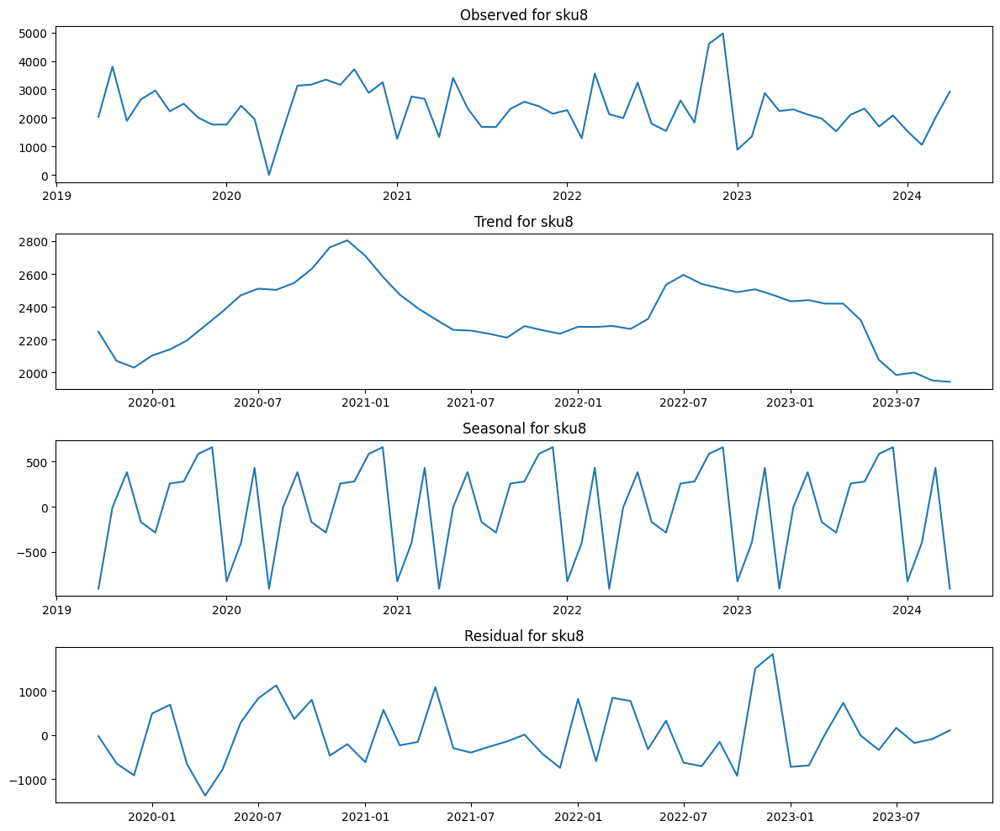

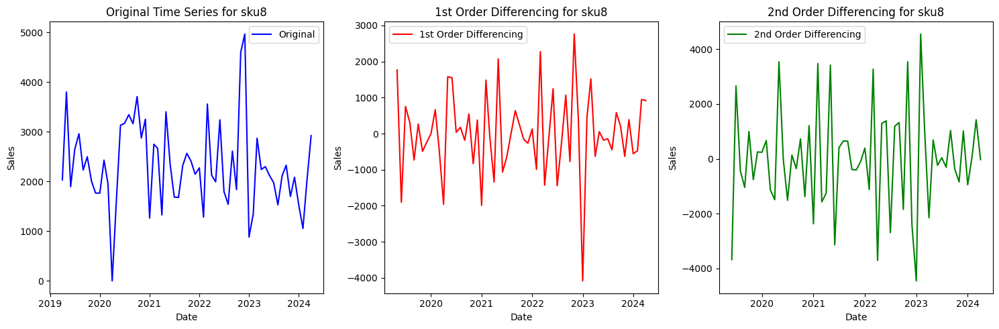

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:09,126 - INFO - ARIMA(1, 1, 1) fitted successfully for sku8
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_m

ADF Test for Original Series for sku8:
ADF Statistic: -6.677212993623944
p-value: 4.434035855742693e-09
Critical Values:
   1%: -3.5443688564814813
   5%: -2.9110731481481484
   10%: -2.5931902777777776
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 1st Differenced Series for sku8:
ADF Statistic: -6.581485853277947
p-value: 7.494947684386695e-09
Critical Values:
   1%: -3.552928203580539
   5%: -2.9147306250000002
   10%: -2.595137155612245
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku8:
ADF Statistic: -6.420145289486819
p-value: 1.7999713538776006e-08
Critical Values:
   1%: -3.560242358792829
   5%: -2.9178502070837
   10%: -2.5967964150943397
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optim

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.03732D+01    |proj g|=  8.73093D-02

At iterate    5    f=  9.07559D+00    |proj g|=  9.96204D-04

At iterate   10    f=  9.07471D+00    |proj g|=  2.21782D-02

At iterate   15    f=  9.00638D+00    |proj g|=  1.34120D-01

At iterate   20    f=  8.98045D+00    |proj g|=  3.56533D-03

At iterate   25    f=  8.97977D+00    |proj g|=  2.49523D-04

At iterate   30    f=  8.97974D+00    |proj g|=  1.90335D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: 

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.60260D+00    |proj g|=  2.17928D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      3      6      1     0     0   7.997D-06   6.589D+00
  F =   6.5892535928643037     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.6

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency infor


At iterate    5    f=  6.53745D+00    |proj g|=  1.65884D-04

At iterate   10    f=  6.53744D+00    |proj g|=  3.08495D-03

At iterate   15    f=  6.53658D+00    |proj g|=  3.52262D-02

At iterate   20    f=  6.52962D+00    |proj g|=  3.63211D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     24     26      1     0     0   2.759D-07   6.530D+00
  F =   6.5296077615619028     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  results_df.loc[sku, 'May_2024_Forecast'] = forecast[1]  # Take the second prediction (May)
2024-07-25 12:29:10,329 - INFO - Processing sku9...


Forecast after differencing adjustment: 2024-05-01    2047.358273
2024-06-01    2052.546534
Freq: MS, Name: predicted_mean, dtype: float64


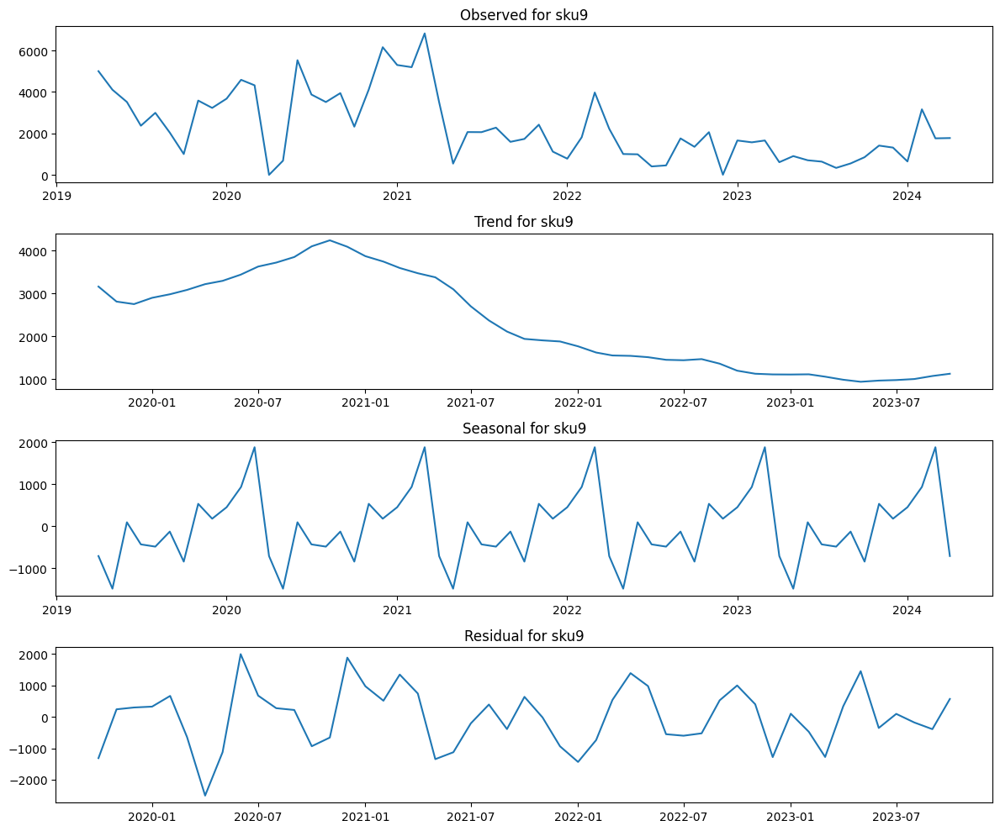

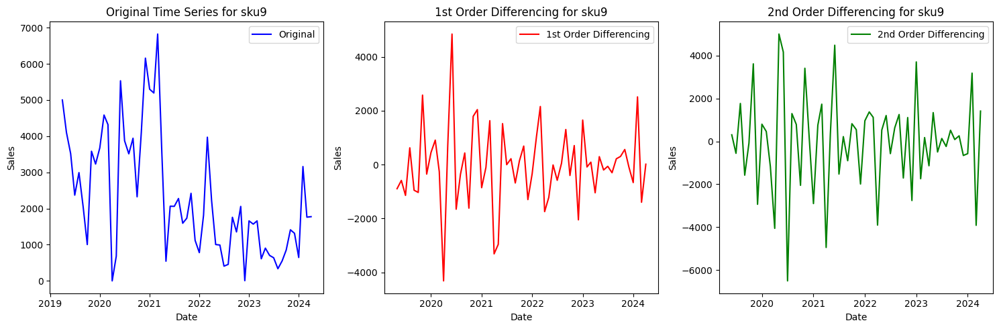

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:11,653 - INFO - ARIMA(1, 1, 1) fitted successfully for sku9
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_m

ADF Test for Original Series for sku9:
ADF Statistic: -2.4568241407861526
p-value: 0.12633590537194983
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku9:
ADF Statistic: -8.896902381526958
p-value: 1.2001138651845633e-14
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku9:
ADF Statistic: -5.851659259871986
p-value: 3.577520749208449e-07
Critical Values:
   1%: -3.5656240522121956
   5%: -2.920142229157715
   10%: -2.598014675124952
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:11,859 - INFO - ARIMA(2, 2, 1) fitted successfully for sku9
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_m

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.59190D+00    |proj g|=  1.29356D+00

At iterate    5    f=  8.88025D+00    |proj g|=  2.43306D-02

At iterate   10    f=  8.67260D+00    |proj g|=  1.09641D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     13     21      1     0     0   5.985D-06   8.673D+00
  F =   8.6725891648539122     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:47

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.19864D+00    |proj g|=  1.81543D+00

At iterate    5    f=  7.08533D+00    |proj g|=  6.04193D-02

At iterate   10    f=  7.01959D+00    |proj g|=  2.74286D-03

At iterate   15    f=  6.89580D+00    |proj g|=  1.57960D-01

At iterate   20    f=  6.70817D+00    |proj g|=  1.09686D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     27      1     0     0   7.984D-06   6.708D+00
  F =   6.7079427292144214     

CONVERG

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)



At iterate    5    f=  6.80542D+00    |proj g|=  1.44550D-04

At iterate   10    f=  6.80540D+00    |proj g|=  3.89637D-03

At iterate   15    f=  6.80405D+00    |proj g|=  3.52034D-02

At iterate   20    f=  6.79861D+00    |proj g|=  2.91646D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     22     24      1     0     0   3.463D-06   6.799D+00
  F =   6.7986076886089526     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


/home/pratik/.local/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  results_df.loc[sku, 'May_2024_Forecast'] = forecast[1]  # Take the second prediction (May)
2024-07-25 12:29:12,776 - INFO - Processing sku10...


Forecast after differencing adjustment: 2024-05-01   -658.011307
2024-06-01   -370.412180
Freq: MS, Name: predicted_mean, dtype: float64


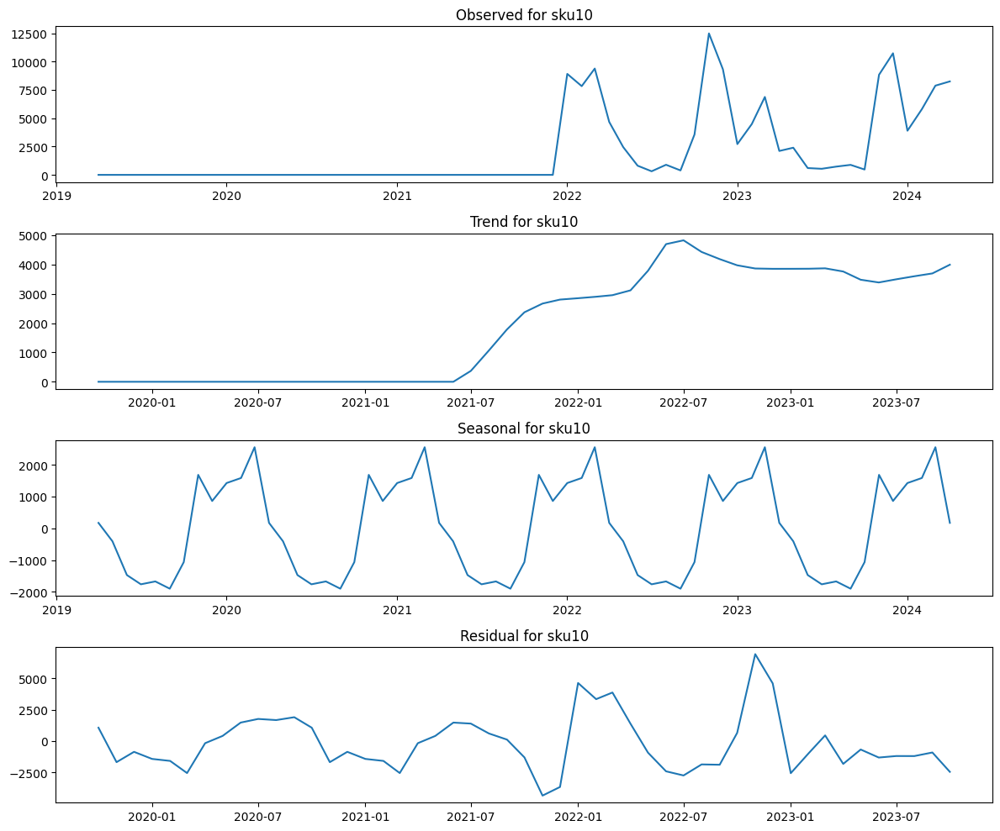

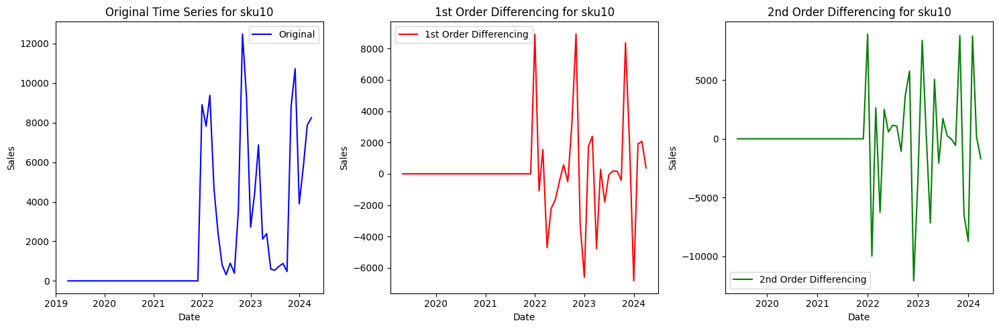

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:14,092 - INFO - ARIMA(1, 1, 1) fitted successfully for sku10
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku10:
ADF Statistic: -2.984332442477883
p-value: 0.03638368497804746
Critical Values:
   1%: -3.5443688564814813
   5%: -2.9110731481481484
   10%: -2.5931902777777776
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 1st Differenced Series for sku10:
ADF Statistic: -5.253410566937375
p-value: 6.833151671602276e-06
Critical Values:
   1%: -3.560242358792829
   5%: -2.9178502070837
   10%: -2.5967964150943397
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku10:
ADF Statistic: -4.376383648223902
p-value: 0.0003267393531017813
Critical Values:
   1%: -3.5778480370438146
   5%: -2.925338105429433
   10%: -2.6007735310095064
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:14,267 - INFO - ARIMA(2, 2, 1) fitted successfully for sku10
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.58630D+00    |proj g|=  1.36355D-02

At iterate    5    f=  9.58605D+00    |proj g|=  3.39952D-04

At iterate   10    f=  9.58599D+00    |proj g|=  6.34195D-03

At iterate   15    f=  9.57953D+00    |proj g|=  6.06783D-02

At iterate   20    f=  9.48878D+00    |proj g|=  8.73869D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     23     37      1     0     0   7.935D-06   9.486D+00
  F =   9.4855753194447026     

CONVERG

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.



At iterate    5    f=  9.49844D+00    |proj g|=  5.79192D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      5      7      1     0     0   5.792D-05   9.498D+00
  F =   9.4984439390345283     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.47914D+02    |proj g|=  5.81218D+01

At iterate    5    f=  1.02147D+02    |proj g|=  1.19542D+00

At iterate   10    f=  3.65791D+01    |proj g|=  1.78964D-01

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.89843D+01    |proj g|=  3.59358D-01

At iterate    5    f=  2.89692D+01    |proj g|=  6.01909D-01

At iterate   10    f=  2.82399D+01    |proj g|=  4.95909D+00

At iterate   15    f=  2.18169D+01    |proj g|=  1.37758D-01

At iterate   20    f=  9.73620D+00    |proj g|=  1.17190D-01

At iterate   25    f=  7.53768D+00    |proj g|=  1.06797D-01

At iterate   30    f=  7.46449D+00    |proj g|=  2.23404D-03


/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys 


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34     38      1     0     0   1.016D-06   7.464D+00
  F =   7.4643649264175975     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.47810D+00    |proj g|=  3.91367D-03

At iterate    5    f=  7.47805D+00    |proj g|=  1.72721D-04

At iterate   10    f=  7.47801D+00    |proj g|=  3.19693D-03

At iterate   15    f=  7.47451D+00    |proj g|=  2.49556D-02

At iter

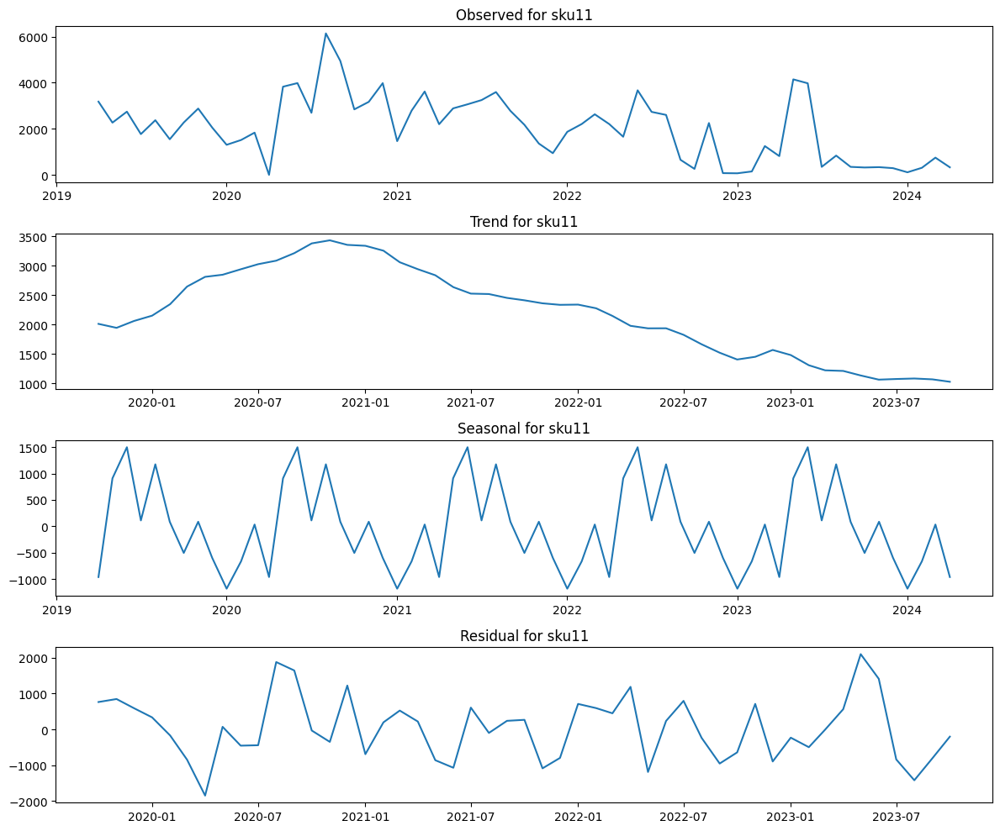

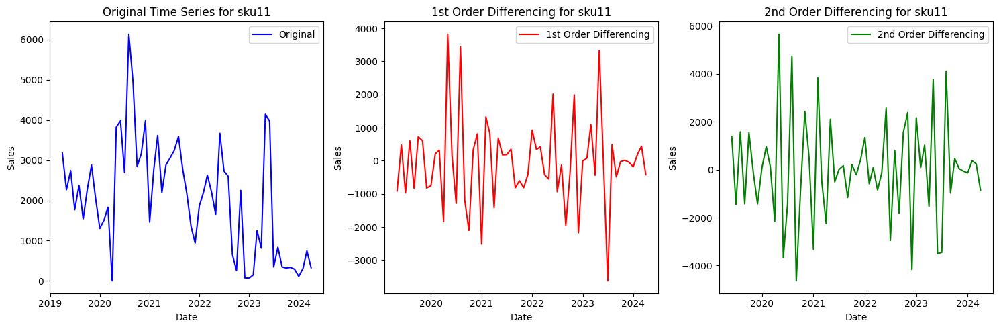

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:16,451 - INFO - ARIMA(1, 1, 1) fitted successfully for sku11
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku11:
ADF Statistic: -0.19154054932896275
p-value: 0.9395224780883169
Critical Values:
   1%: -3.5714715250448363
   5%: -2.922629480573571
   10%: -2.5993358475635153
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku11:
ADF Statistic: -4.44075956411701
p-value: 0.0002512269514080826
Critical Values:
   1%: -3.568485864
   5%: -2.92135992
   10%: -2.5986616
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku11:
ADF Statistic: -4.782607185069119
p-value: 5.870930537179275e-05
Critical Values:
   1%: -3.5745892596209488
   5%: -2.9239543084490744
   10%: -2.6000391840277777
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
2024-07-25 12:29:16,711 - INFO - ARIMA(2, 2, 1) fitted successfully for sku11
/home/pratik/.local/lib/python3.10/site-packages/statsm

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.72343D+00    |proj g|=  2.67825D-01

At iterate    5    f=  8.67503D+00    |proj g|=  1.83899D-04

At iterate   10    f=  8.67502D+00    |proj g|=  3.33092D-03

At iterate   15    f=  8.67320D+00    |proj g|=  4.42616D-02

At iterate   20    f=  8.64607D+00    |proj g|=  6.83027D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     23     27      1     0     0   3.926D-08   8.646D+00
  F =   8.6460322372059366     

CONVERG

 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.65322D+00    |proj g|=  2.71208D-02

At iterate    5    f=  8.65268D+00    |proj g|=  2.92545D-04

At iterate   10    f=  8.65266D+00    |proj g|=  5.28676D-03

At iterate   15    f=  8.65056D+00    |proj g|=  4.66161D-02

At iterate   20    f=  8.64609D+00    |proj g|=  1.96110D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     20     22      1     0     0   1.961D-06   8.646D+00
  F =   8.6460898624493971     

CONVERG

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473


At iterate   20    f=  6.72129D+00    |proj g|=  7.49797D-04

At iterate   25    f=  6.72126D+00    |proj g|=  2.14722D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     38      1     0     0   9.566D-06   6.721D+00
  F =   6.7212447330732443     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.83264D+00    |proj g|=  1.73991D-02

           * * *

Tit   = total number of iterations
Tnf   = total nu

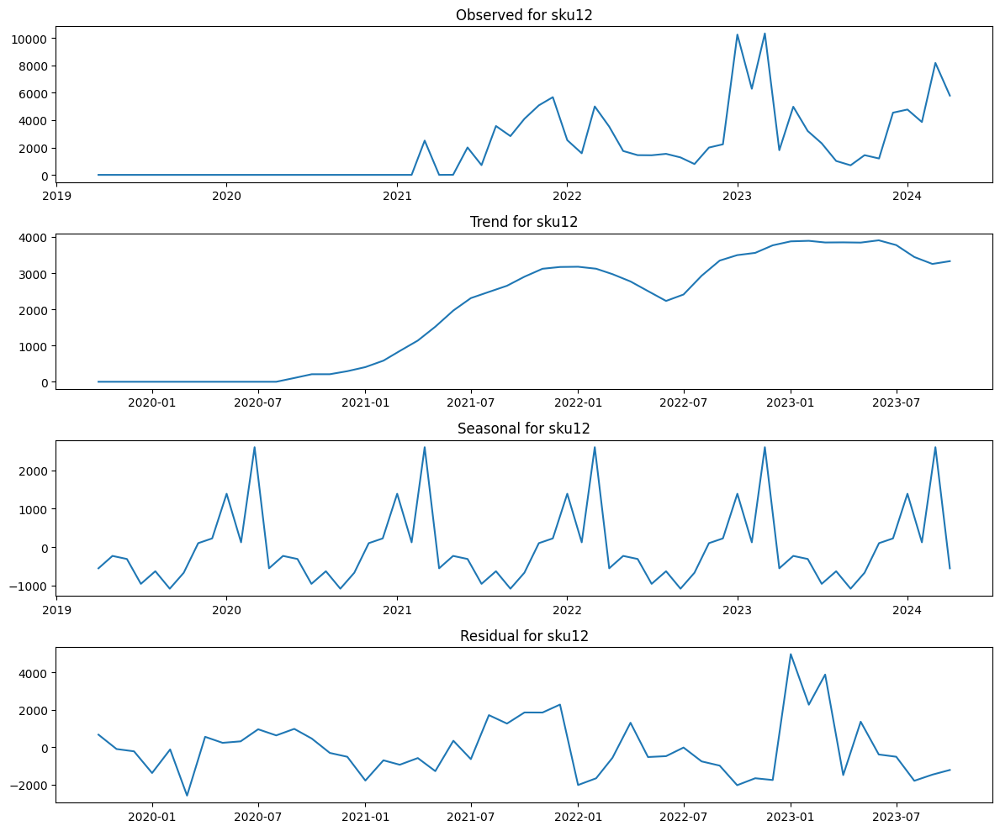

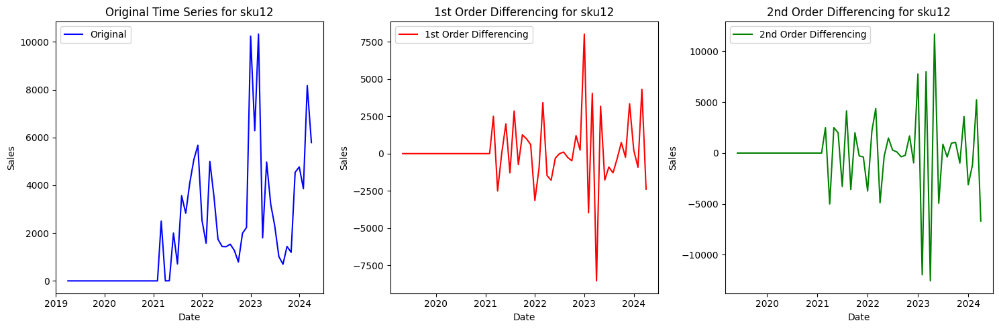

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:19,060 - INFO - ARIMA(1, 1, 1) fitted successfully for sku12
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku12:
ADF Statistic: -2.0985017333952833
p-value: 0.24511748868530253
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku12:
ADF Statistic: -13.279001550507942
p-value: 7.760694790531628e-25
Critical Values:
   1%: -3.5463945337644063
   5%: -2.911939409384601
   10%: -2.5936515282964665
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku12:
ADF Statistic: -4.7167576789833365
p-value: 7.826000510893602e-05
Critical Values:
   1%: -3.568485864
   5%: -2.92135992
   10%: -2.5986616
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optim

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.21983D+00    |proj g|=  2.29716D-02

At iterate    5    f=  9.21920D+00    |proj g|=  1.67198D-03

At iterate   10    f=  9.21836D+00    |proj g|=  2.53963D-02

At iterate   15    f=  9.16061D+00    |proj g|=  1.49130D-01

At iterate   20    f=  9.08846D+00    |proj g|=  2.28500D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     21     27      1     0     0   1.953D-06   9.088D+00
  F =   9.0884583866657493     

CONVERG

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.10551D+00    |proj g|=  4.85532D-02

At iterate    5    f=  9.10236D+00    |proj g|=  8.00861D-04

At iterate   10    f=  9.10193D+00    |proj g|=  1.76313D-02

At iterate   15    f=  9.08797D+00    |proj g|=  1.79328D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     18     22      1     0     0   1.606D-07   9.088D+00
  F =   9.0875648319577138     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.



At iterate    5    f=  7.83060D+00    |proj g|=  2.20762D-02

At iterate   10    f=  7.76033D+00    |proj g|=  2.22325D-03

At iterate   15    f=  7.13755D+00    |proj g|=  9.39937D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     17     18      1     0     0   6.388D-06   7.129D+00
  F =   7.1286116538557582     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.34136D+00    |proj g|=  2.15220D-01

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate   15    f=  7.12948D+00    |proj g|=  1.56112D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     22      1     0     0   4.156D-06   7.127D+00
  F =   7.1267963597591697     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.11729D+00    |proj g|=  3.77085D-04

At iterate    5    f=  7.11538D+00    |proj g|=  6.39672D-04

At iterate   10    f=  7.10405D+00    |proj g|=  4.37942D-03

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  results_df.loc[sku, 'May_2024_Forecast'] = forecast[1]  # Take the second prediction (May)
2024-07-25 12:29:20,318 - INFO - Processing sku13...



At iterate   20    f=  7.30343D+00    |proj g|=  3.06066D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     20     22      1     0     0   3.061D-07   7.303D+00
  F =   7.3034327728718740     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Forecast after differencing adjustment: 2024-05-01   -718.212314
2024-06-01   -617.849841
Freq: MS, Name: predicted_mean, dtype: float64


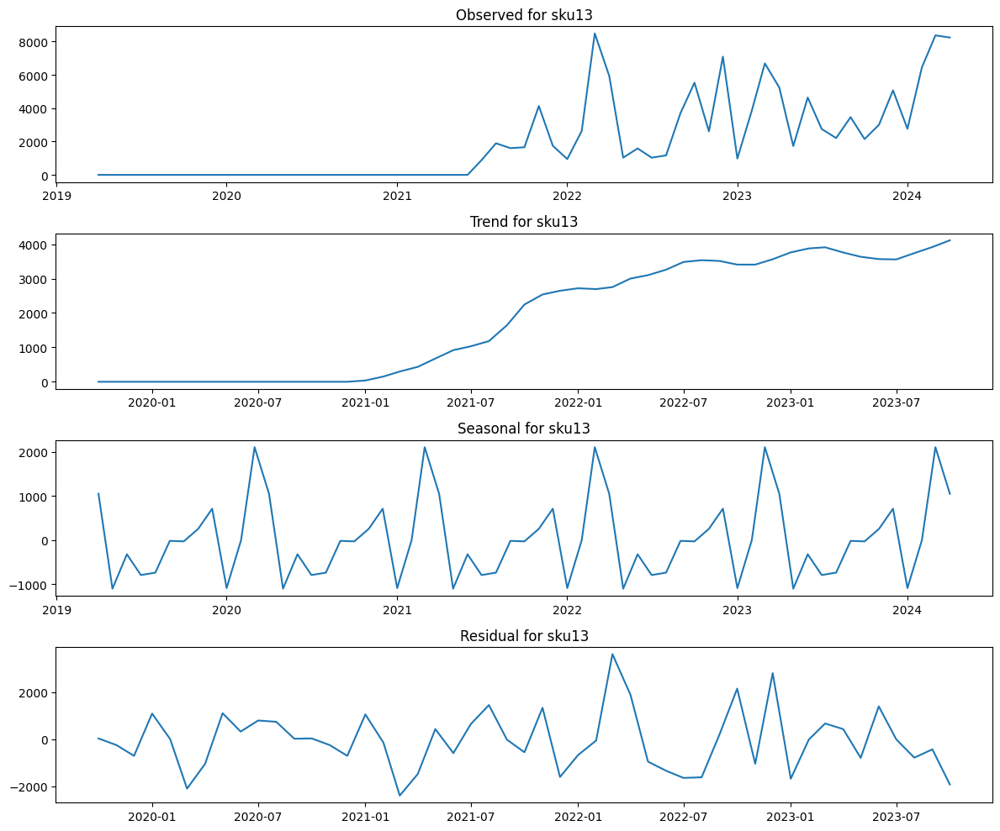

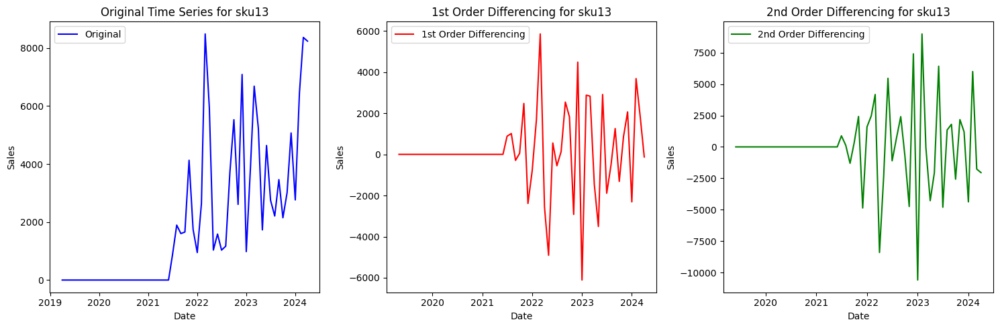

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
2024-07-25 12:29:21,483 - INFO - ARIMA(1, 1, 1) fitted successfully for sku13
/home/pratik/.local/lib/python3.10/site-packag

ADF Test for Original Series for sku13:
ADF Statistic: 0.17544528857991304
p-value: 0.9708502754529962
Critical Values:
   1%: -3.5714715250448363
   5%: -2.922629480573571
   10%: -2.5993358475635153
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku13:
ADF Statistic: -3.1672050446964652
p-value: 0.021963203654492072
Critical Values:
   1%: -3.5714715250448363
   5%: -2.922629480573571
   10%: -2.5993358475635153
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku13:
ADF Statistic: -2.952820849939329
p-value: 0.03954145355533626
Critical Values:
   1%: -3.568485864
   5%: -2.92135992
   10%: -2.5986616
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
2024-07-25 12:29:21,683 - INFO - ARIMA(2, 2, 1) fitted successfully for sku13
/home/pratik/.local/lib/python3.10/site-packag

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.06428D+00    |proj g|=  9.54657D-02

At iterate    5    f=  9.05454D+00    |proj g|=  8.86545D-04

At iterate   10    f=  9.05429D+00    |proj g|=  1.40233D-02

At iterate   15    f=  9.03063D+00    |proj g|=  1.01208D-01

At iterate   20    f=  8.97555D+00    |proj g|=  4.12364D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     23     28      1     0     0   3.349D-06   8.976D+00
  F =   8.9755324389539055     

CONVERG

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: 


At iterate    5    f=  7.15014D+00    |proj g|=  2.73772D-02

At iterate   10    f=  7.12527D+00    |proj g|=  6.51664D-02

At iterate   15    f=  7.09718D+00    |proj g|=  9.56996D-04

At iterate   20    f=  7.09054D+00    |proj g|=  9.27497D-02

At iterate   25    f=  7.05337D+00    |proj g|=  3.07450D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     31      1     0     0   4.311D-06   7.053D+00
  F =   7.0533342826774987     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.06671D+00    |proj g|=  9.72460D-03

At iterate    5    f=  7.06618D+00    |proj g|=  8.46166D-05

At iterate   10    f=  7.06614D+00    |proj g|=  2.70730D-03

At iterate   15    f=  7.06169D+00    |proj g|=  3.65258D-02

At iterate   20    f=  7.04700D+00    |proj g|=  2.00479D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     21     23      1     0     0   4.848D-06   7.047D+00
  F =   7.0470016600549670     

CONVERG

/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  results_df.loc[sku, 'May_2024_Forecast'] = forecast[1]  # Take the second prediction (May)
2024-07-25 12:29:22,919 - INFO - Processing sku14...



At iterate   20    f=  7.26548D+00    |proj g|=  3.67944D-04

At iterate   25    f=  7.25532D+00    |proj g|=  4.49749D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     33      1     0     0   2.799D-07   7.255D+00
  F =   7.2552198170426818     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Forecast after differencing adjustment: 2024-05-01   -1939.530858
2024-06-01    1180.912830
Freq: MS, Name: predicted_mean, dtype: float64


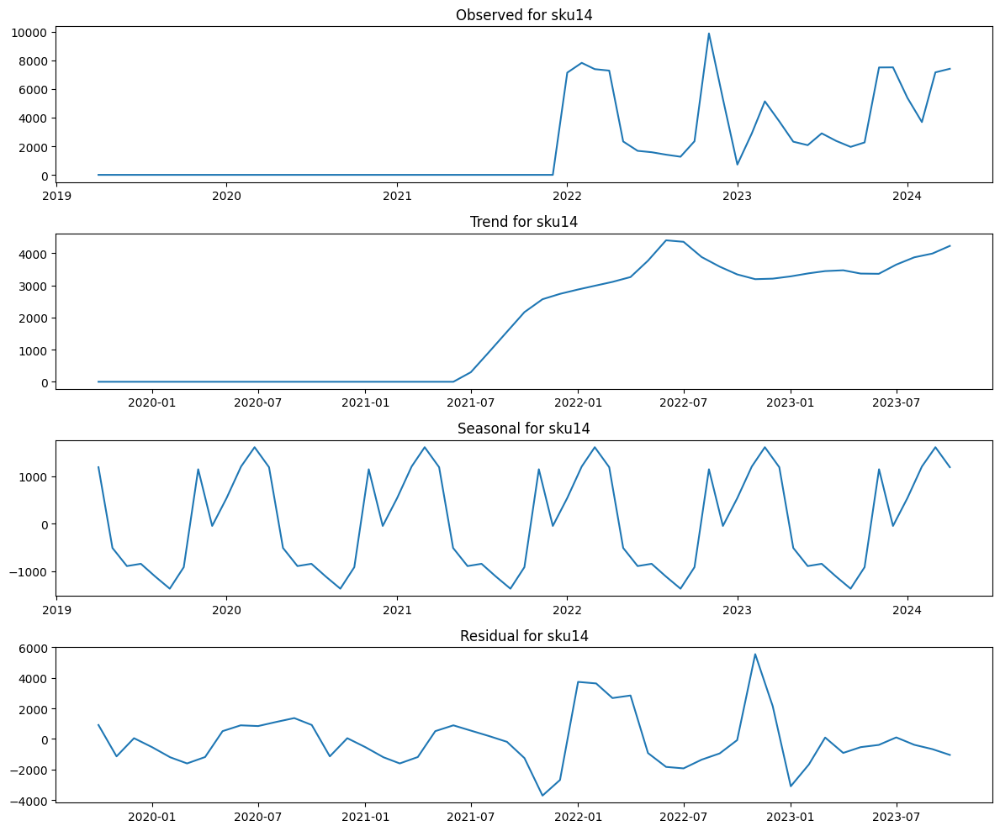

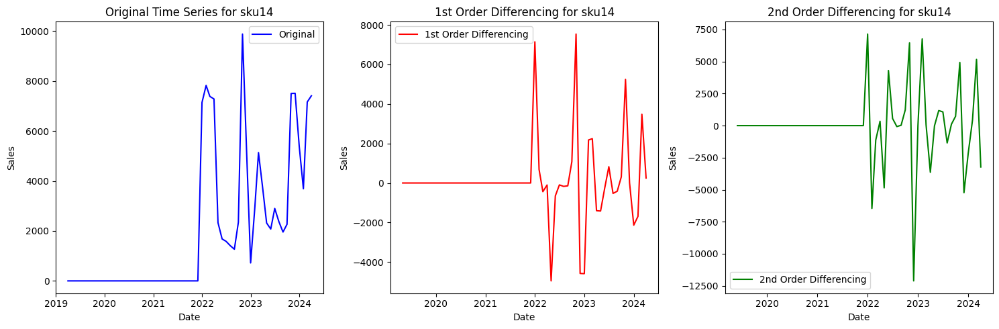

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:24,107 - INFO - ARIMA(1, 1, 1) fitted successfully for sku14
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku14:
ADF Statistic: -1.8103100118605948
p-value: 0.3753552059095662
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku14:
ADF Statistic: -3.73826405629409
p-value: 0.0036060188174228667
Critical Values:
   1%: -3.5714715250448363
   5%: -2.922629480573571
   10%: -2.5993358475635153
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku14:
ADF Statistic: -4.058674672272227
p-value: 0.0011325925657847007
Critical Values:
   1%: -3.5778480370438146
   5%: -2.925338105429433
   10%: -2.6007735310095064
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:24,298 - INFO - ARIMA(2, 2, 1) fitted successfully for sku14
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.07139D+00    |proj g|=  1.03579D-01

At iterate    5    f=  9.01386D+00    |proj g|=  1.67390D-04

At iterate   10    f=  9.01379D+00    |proj g|=  7.09071D-03

At iterate   15    f=  9.00543D+00    |proj g|=  8.64742D-02

At iterate   20    f=  8.95571D+00    |proj g|=  1.57027D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     21     25      1     0     0   7.163D-06   8.956D+00
  F =   8.9557126743702469     

CONVERG

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.



At iterate   15    f=  8.96794D+00    |proj g|=  4.61289D-02

At iterate   20    f=  8.95572D+00    |proj g|=  3.48581D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     21     23      1     0     0   3.804D-06   8.956D+00
  F =   8.9557225003234873     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.10135D+01    |proj g|=  3.30197D+00

At iterate    5    f=  8.71233D+00    |proj g|=  6.83688D-02

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:47


At iterate    5    f=  1.05065D+01    |proj g|=  8.25422D-02

At iterate   10    f=  1.02151D+01    |proj g|=  5.78105D-02

At iterate   15    f=  7.32687D+00    |proj g|=  2.72803D-02

At iterate   20    f=  7.07079D+00    |proj g|=  9.93817D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     27      1     0     0   1.893D-06   7.069D+00
  F =   7.0694683289468339     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.



At iterate   15    f=  7.05935D+00    |proj g|=  3.02665D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     15     16      1     0     0   3.027D-06   7.059D+00
  F =   7.0593460504554288     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.54051D+00    |proj g|=  6.26273D-01

At iterate    5    f=  7.33518D+00    |proj g|=  3.03502D-04

At iterate   10    f=  7.33518D+00    |proj g|=  7.51888D-05

At iter

/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  results_df.loc[sku, 'May_2024_Forecast'] = forecast[1]  # Take the second prediction (May)
2024-07-25 12:29:25,389 - INFO - Processing sku15...


Forecast after differencing adjustment: 2024-05-01   -1441.127171
2024-06-01    -205.349878
Freq: MS, Name: predicted_mean, dtype: float64


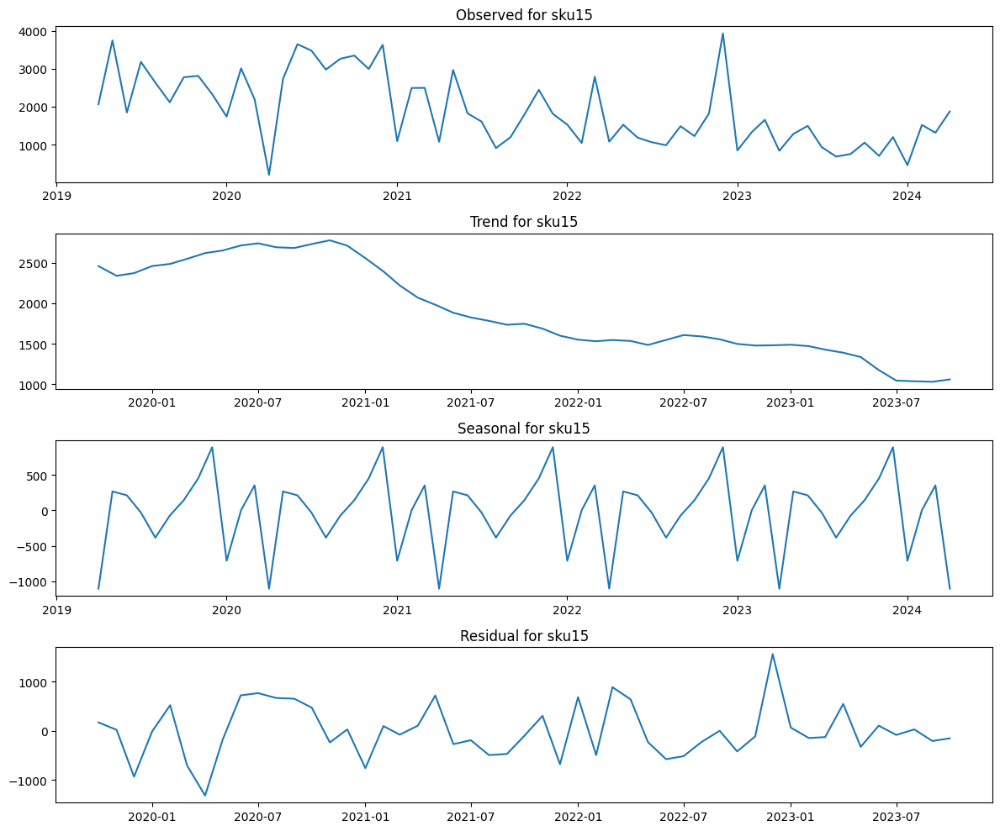

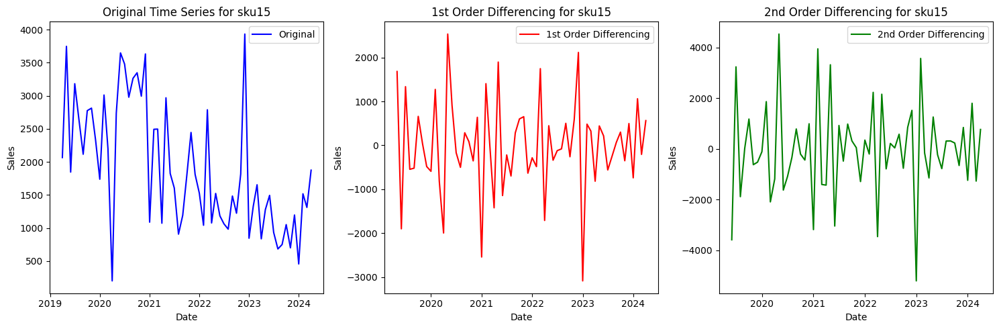

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:26,738 - INFO - ARIMA(1, 1, 1) fitted successfully for sku15
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku15:
ADF Statistic: -2.1686792486588278
p-value: 0.21780878189198988
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku15:
ADF Statistic: -9.82322936190448
p-value: 5.2699732748260866e-17
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku15:
ADF Statistic: -6.331081936092428
p-value: 2.905291195543222e-08
Critical Values:
   1%: -3.560242358792829
   5%: -2.9178502070837
   10%: -2.5967964150943397
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:26,911 - INFO - ARIMA(2, 2, 1) fitted successfully for sku15
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.17710D+00    |proj g|=  6.21481D-02

At iterate    5    f=  8.54531D+00    |proj g|=  1.00301D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      7     11      1     0     0   9.390D-06   8.543D+00
  F =   8.5430653951917748     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 v

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.42018D+00    |proj g|=  1.10203D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      4      6      1     0     0   1.322D-05   6.420D+00
  F =   6.4198877815997717     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.7

/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  results_df.loc[sku, 'May_2024_Forecast'] = forecast[1]  # Take the second prediction (May)
2024-07-25 12:29:28,014 - INFO - Processing sku16...


Forecast after differencing adjustment: 2024-05-01    1453.509248
2024-06-01    -507.801317
Freq: MS, Name: predicted_mean, dtype: float64


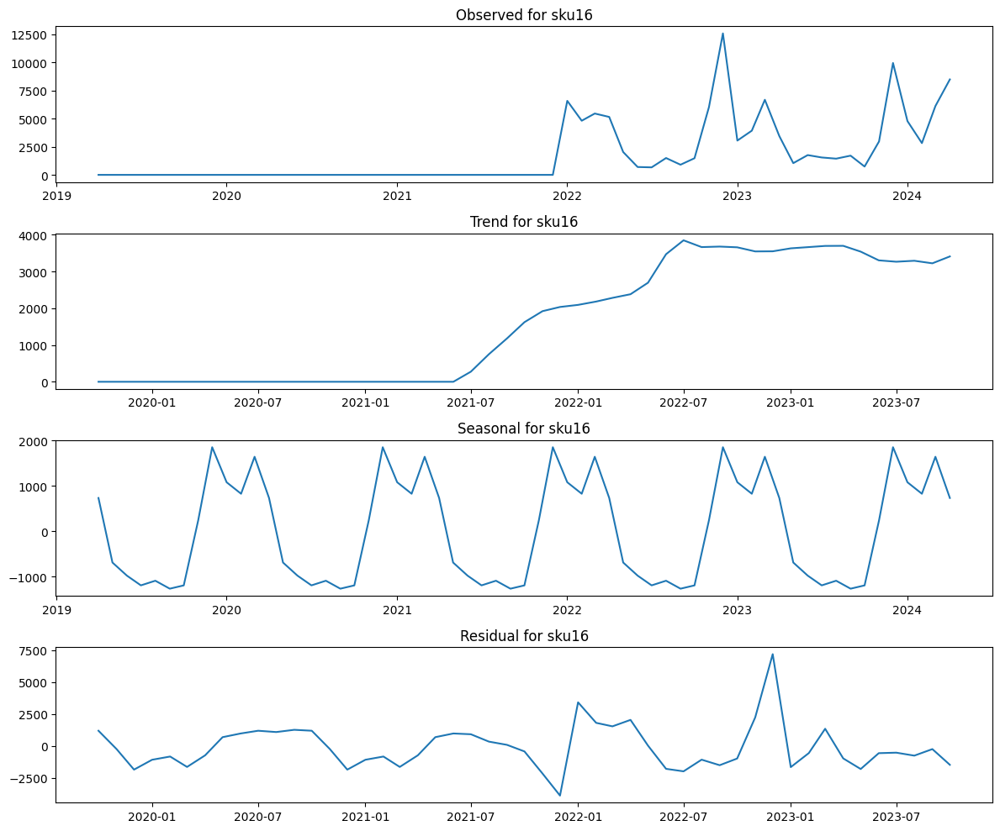

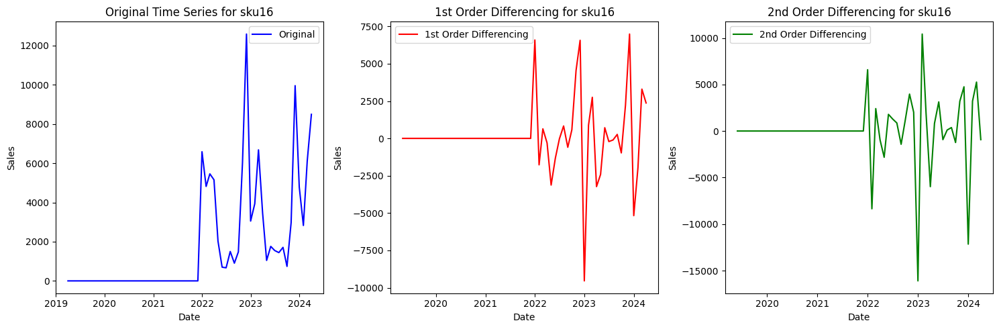

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:29,243 - INFO - ARIMA(1, 1, 1) fitted successfully for sku16
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku16:
ADF Statistic: -1.6656499150333715
p-value: 0.4488918661433996
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku16:
ADF Statistic: -5.220550052041413
p-value: 7.981303294781988e-06
Critical Values:
   1%: -3.562878534649522
   5%: -2.918973284023669
   10%: -2.597393446745562
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku16:
ADF Statistic: -4.440247738577531
p-value: 0.0002517559757087096
Critical Values:
   1%: -3.5778480370438146
   5%: -2.925338105429433
   10%: -2.6007735310095064
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:29,456 - INFO - ARIMA(2, 2, 1) fitted successfully for sku16
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.09516D+00    |proj g|=  1.81233D-01

At iterate    5    f=  9.05781D+00    |proj g|=  1.36507D-04

At iterate   10    f=  9.05777D+00    |proj g|=  4.42041D-03

At iterate   15    f=  9.05317D+00    |proj g|=  4.14726D-02

At iterate   20    f=  9.02903D+00    |proj g|=  3.58792D-02

At iterate   25    f=  9.02065D+00    |proj g|=  1.75579D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     27     33      1     0     0   

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.



At iterate   10    f=  9.03002D+00    |proj g|=  1.71417D-03

At iterate   15    f=  9.02937D+00    |proj g|=  2.11422D-02

At iterate   20    f=  9.02178D+00    |proj g|=  3.04642D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     22     29      1     0     0   1.707D-06   9.022D+00
  F =   9.0217663869497713     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.94938D+00    |proj g|=  1.54924D+00

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:47


At iterate   10    f=  8.27396D+00    |proj g|=  4.60901D-03

At iterate   15    f=  7.18861D+00    |proj g|=  4.19195D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     19     20      1     0     0   3.523D-06   7.110D+00
  F =   7.1096646693159240     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.37385D+00    |proj g|=  3.33416D-01

At iterate    5    f=  7.15174D+00    |proj g|=  6.25768D-03

At iter

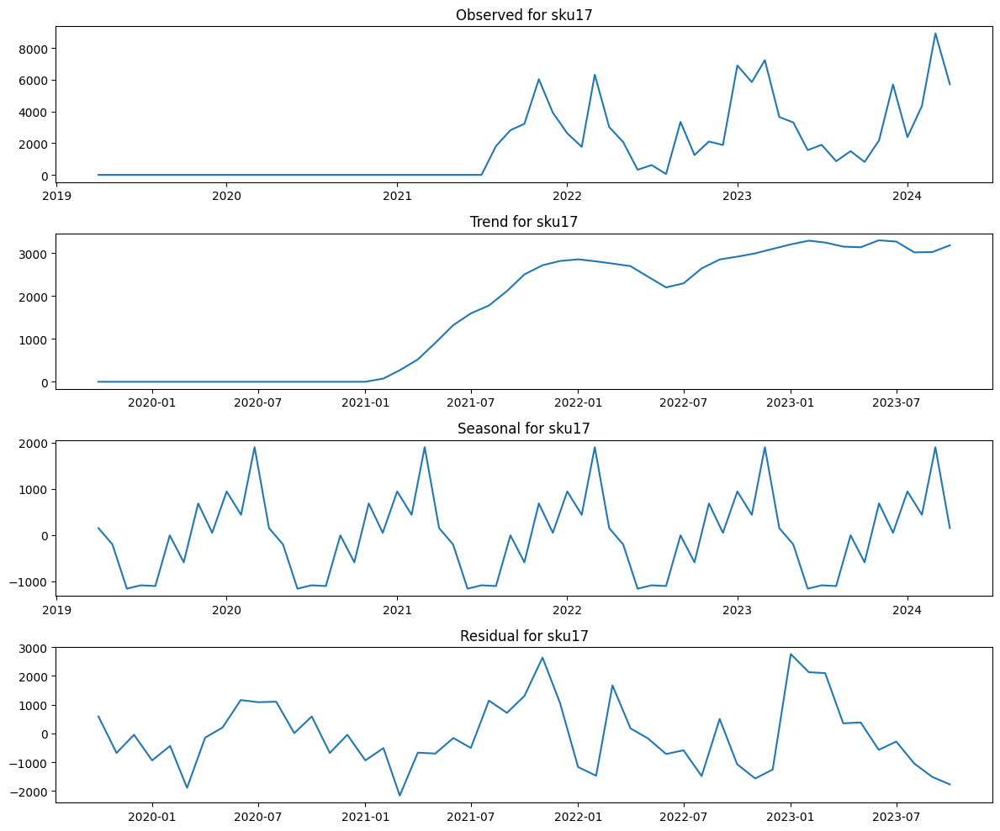

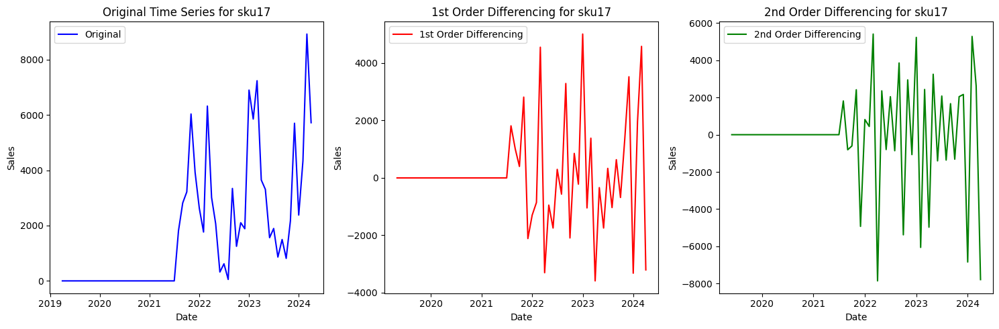

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:31,475 - INFO - ARIMA(1, 1, 1) fitted successfully for sku17
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku17:
ADF Statistic: -0.5665076960591242
p-value: 0.8783717644503333
Critical Values:
   1%: -3.568485864
   5%: -2.92135992
   10%: -2.5986616
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku17:
ADF Statistic: -4.8370760510681645
p-value: 4.6166681619384895e-05
Critical Values:
   1%: -3.568485864
   5%: -2.92135992
   10%: -2.5986616
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku17:
ADF Statistic: -4.436754016599737
p-value: 0.0002553954404080207
Critical Values:
   1%: -3.5745892596209488
   5%: -2.9239543084490744
   10%: -2.6000391840277777
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: No

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.76020D+00    |proj g|=  1.29786D-01

At iterate    5    f=  8.74583D+00    |proj g|=  6.09306D-04

At iterate   10    f=  8.74571D+00    |proj g|=  1.09477D-02

At iterate   15    f=  8.73209D+00    |proj g|=  1.19148D-01

At iterate   20    f=  8.69630D+00    |proj g|=  5.24883D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     21     23      1     0     0   3.597D-07   8.696D+00
  F =   8.6963043577139523     

CONVERG

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.



At iterate    5    f=  6.85118D+00    |proj g|=  1.52561D-03

At iterate   10    f=  6.84847D+00    |proj g|=  8.24905D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     13     15      1     0     0   9.908D-06   6.845D+00
  F =   6.8447590242300898     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.98560D+00    |proj g|=  2.06175D-01

At iterate    5    f=  6.95147D+00    |proj g|=  1.02200D-01

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency infor


At iterate   20    f=  6.84437D+00    |proj g|=  7.61250D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     21     23      1     0     0   1.042D-06   6.844D+00
  F =   6.8443678317765171     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Forecast after differencing adjustment: 2024-05-01    1243.618041
2024-06-01    -280.295068
Freq: MS, Name: predicted_mean, dtype: float64


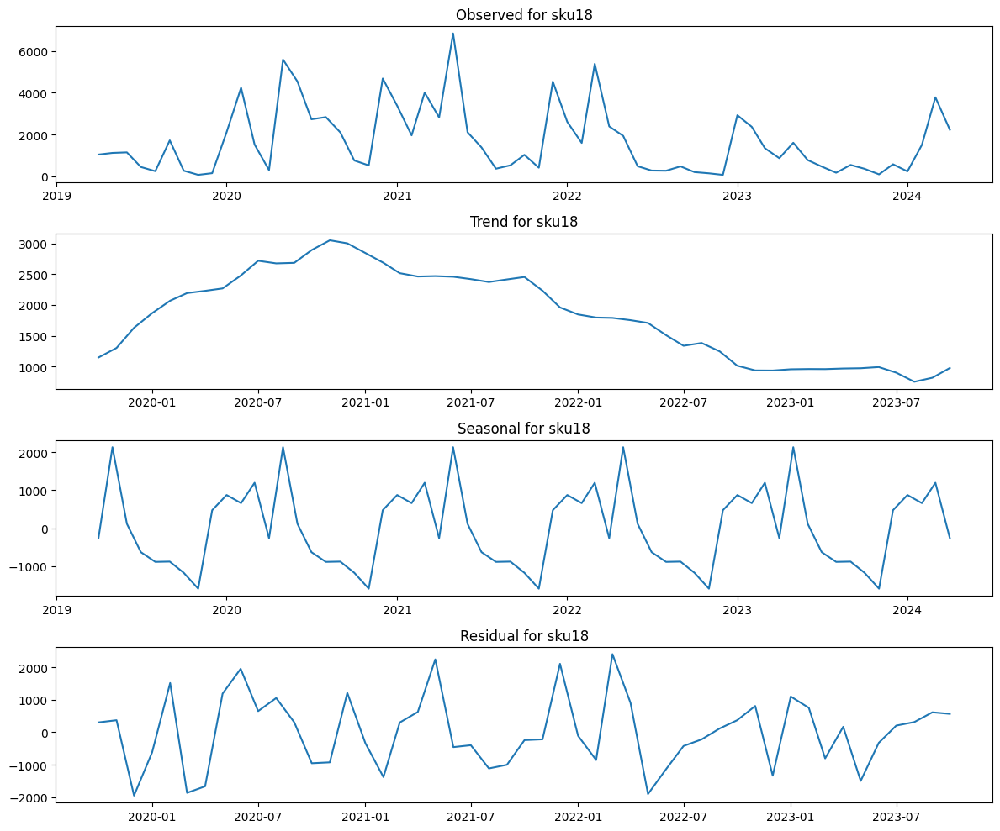

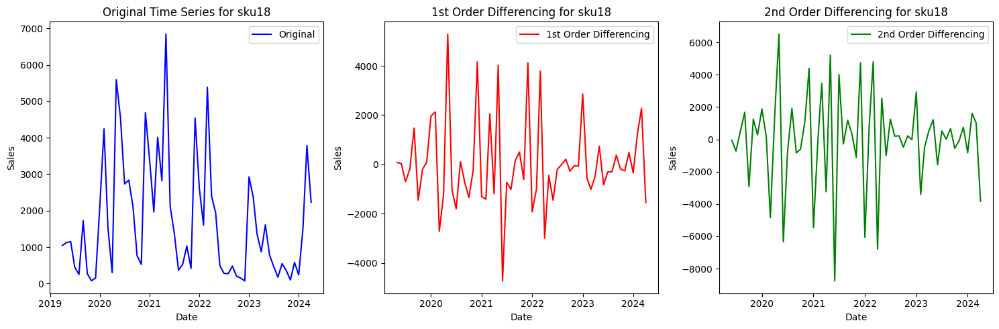

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:33,971 - INFO - ARIMA(1, 1, 1) fitted successfully for sku18
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku18:
ADF Statistic: -5.072331969036684
p-value: 1.5930581006429686e-05
Critical Values:
   1%: -3.5443688564814813
   5%: -2.9110731481481484
   10%: -2.5931902777777776
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 1st Differenced Series for sku18:
ADF Statistic: -2.2768226831960425
p-value: 0.1795521003879772
Critical Values:
   1%: -3.5745892596209488
   5%: -2.9239543084490744
   10%: -2.6000391840277777
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 2nd Differenced Series for sku18:
ADF Statistic: -5.58778592071884
p-value: 1.3505506499626024e-06
Critical Values:
   1%: -3.5778480370438146
   5%: -2.925338105429433
   10%: -2.6007735310095064
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:34,180 - INFO - ARIMA(2, 2, 1) fitted successfully for sku18
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.27635D+00    |proj g|=  4.58020D-01

At iterate    5    f=  9.04620D+00    |proj g|=  7.24411D-03

At iterate   10    f=  9.02556D+00    |proj g|=  6.60125D-04

At iterate   15    f=  8.92936D+00    |proj g|=  3.51736D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     15     16      1     0     0   3.517D-06   8.929D+00
  F =   8.9293572443999114     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.



At iterate    5    f=  8.94132D+00    |proj g|=  5.74968D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      5      7      1     0     0   5.750D-05   8.941D+00
  F =   8.9413172153710629     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92394D+01    |proj g|=  4.71517D+00

At iterate    5    f=  1.25792D+01    |proj g|=  3.78887D-02

At iterate   10    f=  7.34007D+00    |proj g|=  1.72982D-03

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.04411D+01    |proj g|=  8.21426D+00

At iterate    5    f=  2.41848D+01    |proj g|=  5.24853D-01

At iterate   10    f=  2.03980D+01    |proj g|=  1.23912D-01

At iterate   15    f=  9.32247D+00    |proj g|=  8.27889D-01

At iterate   20    f=  7.12199D+00    |proj g|=  4.53544D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     29      1     0     0   4.929D-06   7.028D+00
  F =   7.0276584365559227     

CONVERG

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.



At iterate   10    f=  7.04249D+00    |proj g|=  7.31667D-03

At iterate   15    f=  7.03891D+00    |proj g|=  6.51451D-02

At iterate   20    f=  7.02590D+00    |proj g|=  1.14237D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     23     25      1     0     0   4.242D-07   7.026D+00
  F =   7.0258856375687229     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.58381D+00    |proj g|=  3.59291D-01

At iter

/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  results_df.loc[sku, 'May_2024_Forecast'] = forecast[1]  # Take the second prediction (May)
2024-07-25 12:29:35,178 - INFO - Processing sku19...


Forecast after differencing adjustment: 2024-05-01    3002.509424
2024-06-01    1592.072328
Freq: MS, Name: predicted_mean, dtype: float64


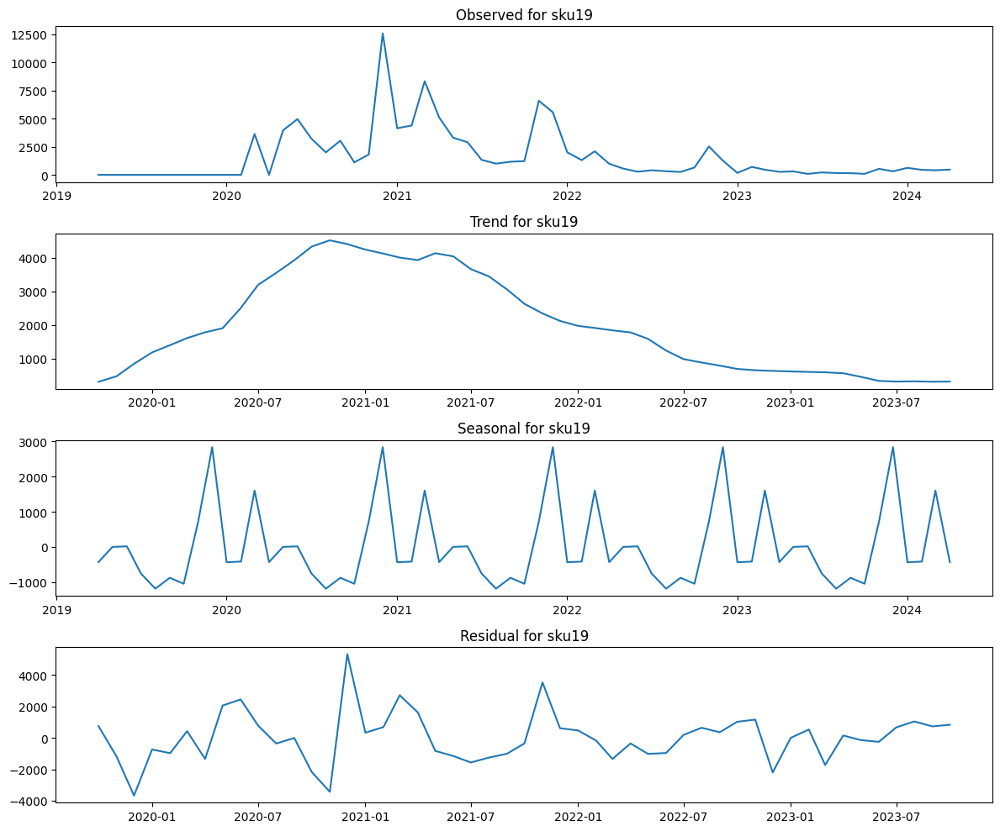

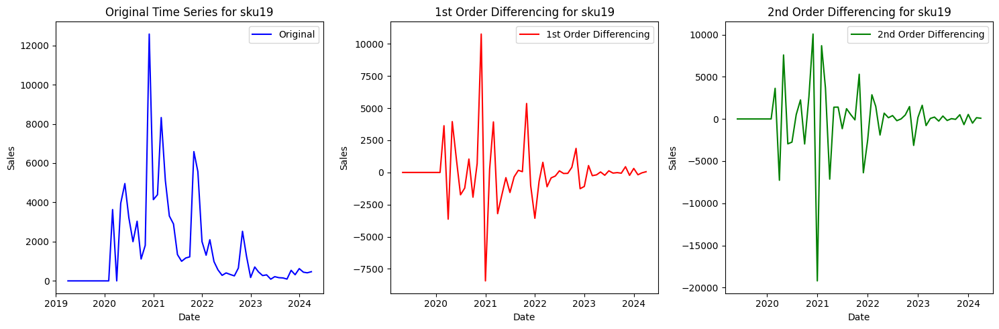

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:36,321 - INFO - ARIMA(1, 1, 1) fitted successfully for sku19
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku19:
ADF Statistic: -2.0832910731181307
p-value: 0.2512862042453304
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku19:
ADF Statistic: -9.801669745527393
p-value: 5.972358721640619e-17
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku19:
ADF Statistic: -5.261668824552584
p-value: 6.570805168739663e-06
Critical Values:
   1%: -3.5778480370438146
   5%: -2.925338105429433
   10%: -2.6007735310095064
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:36,515 - INFO - ARIMA(2, 2, 1) fitted successfully for sku19
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.56714D+01    |proj g|=  3.43050D+00

At iterate    5    f=  1.52588D+01    |proj g|=  2.95569D-01

At iterate   10    f=  1.36466D+01    |proj g|=  3.79457D+00

At iterate   15    f=  9.51940D+00    |proj g|=  7.92997D-01

At iterate   20    f=  9.21188D+00    |proj g|=  1.85479D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     22     26      1     0     0   6.162D-06   9.212D+00
  F =   9.2118762787174866     

CONVERG

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'



At iterate    5    f=  4.27091D+02    |proj g|=  1.31594D+01

At iterate   10    f=  1.14235D+02    |proj g|=  1.62091D+00

At iterate   15    f=  2.05226D+01    |proj g|=  8.08460D-02

At iterate   20    f=  8.37828D+00    |proj g|=  3.83669D-03

At iterate   25    f=  7.21941D+00    |proj g|=  1.08511D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     27     28      1     0     0   9.183D-06   7.206D+00
  F =   7.2060344865015731     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.



At iterate    5    f=  1.35003D+02    |proj g|=  4.57946D+00

At iterate   10    f=  8.36572D+01    |proj g|=  9.11301D+00

At iterate   15    f=  1.90625D+01    |proj g|=  4.18685D+00

At iterate   20    f=  8.24613D+00    |proj g|=  1.03488D-01

At iterate   25    f=  7.21454D+00    |proj g|=  2.61170D-02

At iterate   30    f=  7.20403D+00    |proj g|=  1.07206D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31     35      1     0     0   2.142D-06   7.204D+00
  F =   7.2040342977252232     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys 

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.35966D+00    |proj g|=  8.28102D-04

At iterate    5    f=  7.35965D+00    |proj g|=  1.18554D-03

At iterate   10    f=  7.35942D+00    |proj g|=  1.87399D-02

At iterate   15    f=  7.33832D+00    |proj g|=  1.22284D-01

At iterate   20    f=  7.31972D+00    |proj g|=  3.42857D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     23     25      1     0     0   7.496D-07   7.320D+00
  F =   7.3197118920142268     

CONVERG

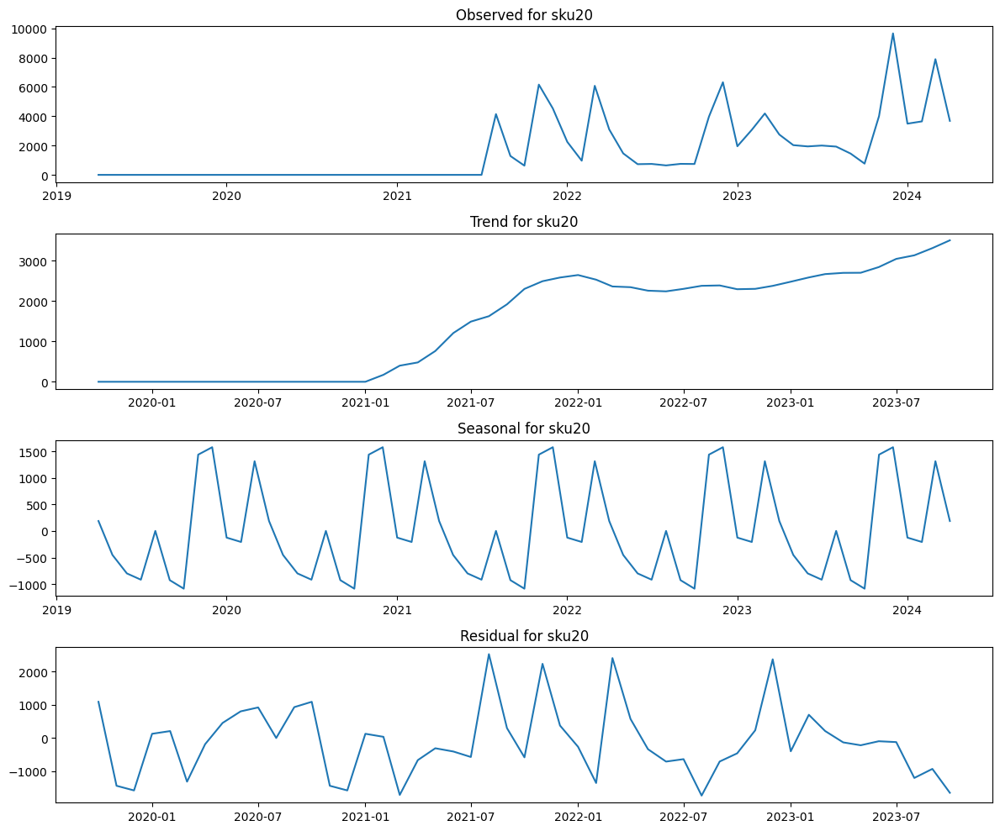

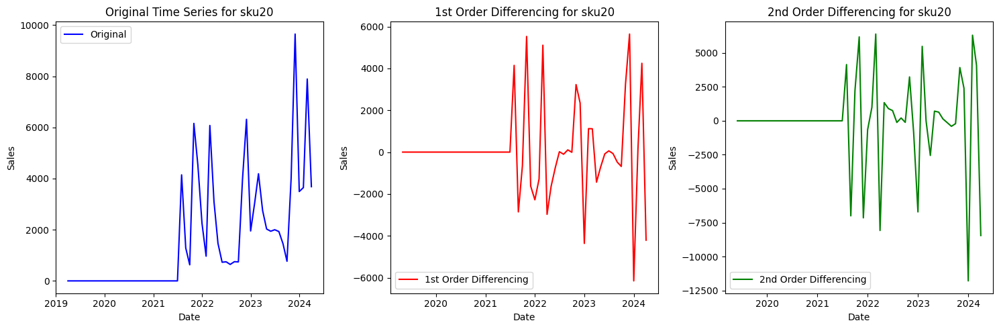

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
2024-07-25 12:29:38,631 - INFO - ARIMA(1, 1, 1) fitted successfully for sku20
/home/pratik/.local/lib/python3.10/site-packag

ADF Test for Original Series for sku20:
ADF Statistic: -0.304580551636099
p-value: 0.9248530789816478
Critical Values:
   1%: -3.5714715250448363
   5%: -2.922629480573571
   10%: -2.5993358475635153
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku20:
ADF Statistic: -4.679649592465376
p-value: 9.188079298146472e-05
Critical Values:
   1%: -3.5714715250448363
   5%: -2.922629480573571
   10%: -2.5993358475635153
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku20:
ADF Statistic: -4.870930293441595
p-value: 3.971458810876774e-05
Critical Values:
   1%: -3.5778480370438146
   5%: -2.925338105429433
   10%: -2.6007735310095064
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
2024-07-25 12:29:38,821 - INFO - ARIMA(2, 2, 1) fitted successfully for sku20
/home/pratik/.local/lib/python3.10/site-packag

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.82452D+00    |proj g|=  2.26678D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      3      5      1     0     0   2.906D-06   8.800D+00
  F =   8.7995638381941106     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.0

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.55282D+01    |proj g|=  6.89920D+00

At iterate    5    f=  1.15090D+01    |proj g|=  2.00482D-01

At iterate   10    f=  1.08276D+01    |proj g|=  2.35935D-02

At iterate   15    f=  7.28515D+00    |proj g|=  2.89105D-01

At iterate   20    f=  6.91372D+00    |proj g|=  8.96311D-05

At iterate   25    f=  6.90840D+00    |proj g|=  9.42180D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     29      1     0     0   

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys 

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.27225D+00    |proj g|=  1.05604D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      3      6      1     0     0   3.728D-06   7.262D+00
  F =   7.2615304111280201     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Forecast after differencing adjustment: 2024-05-01   -723.0
2024-06-01    -86.0
Freq: MS, Name: predicted_mean, dtype: float64


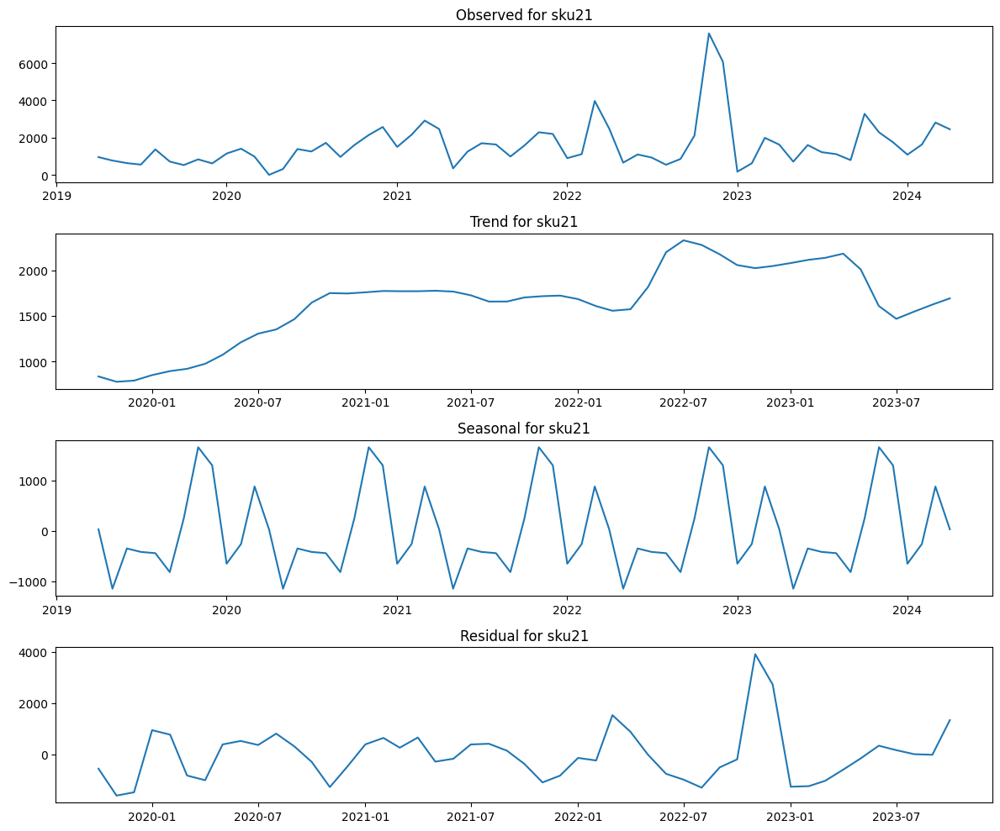

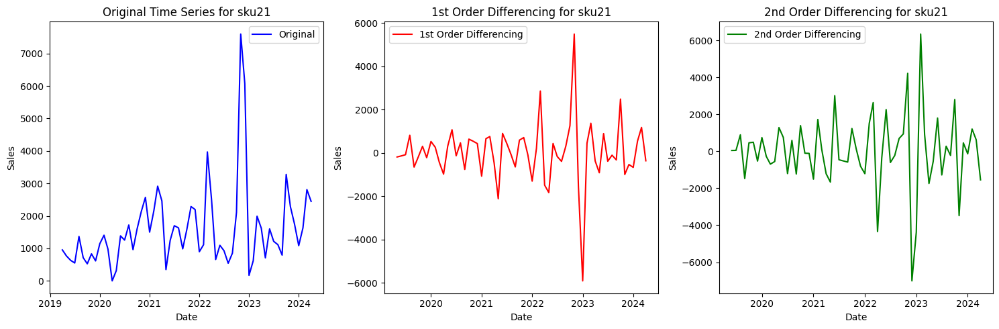

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:40,990 - INFO - ARIMA(1, 1, 1) fitted successfully for sku21
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku21:
ADF Statistic: -6.242562785486353
p-value: 4.658769511601307e-08
Critical Values:
   1%: -3.5463945337644063
   5%: -2.911939409384601
   10%: -2.5936515282964665
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 1st Differenced Series for sku21:
ADF Statistic: -4.3342180595710325
p-value: 0.000387356483508987
Critical Values:
   1%: -3.568485864
   5%: -2.92135992
   10%: -2.5986616
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku21:
ADF Statistic: -4.610561599433874
p-value: 0.00012350191814214194
Critical Values:
   1%: -3.5778480370438146
   5%: -2.925338105429433
   10%: -2.6007735310095064
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:41,163 - INFO - ARIMA(2, 2, 1) fitted successfully for sku21
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.30997D+00    |proj g|=  5.85297D-01

At iterate    5    f=  9.00312D+00    |proj g|=  2.27431D-04

At iterate   10    f=  9.00302D+00    |proj g|=  7.33881D-03

At iterate   15    f=  8.99217D+00    |proj g|=  5.59034D-02

At iterate   20    f=  8.83854D+00    |proj g|=  1.13025D-04

At iterate   25    f=  8.83735D+00    |proj g|=  5.55408D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     28     40      1     0     0   

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.24957D+00    |proj g|=  1.24406D+00

At iterate    5    f=  8.68180D+00    |proj g|=  3.19345D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      7      8      1     0     0   3.648D-05   8.682D+00
  F =   8.6818039847918076     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 v

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency infor

Forecast after differencing adjustment: 2024-05-01    1702.997940
2024-06-01    1435.494228
Freq: MS, Name: predicted_mean, dtype: float64


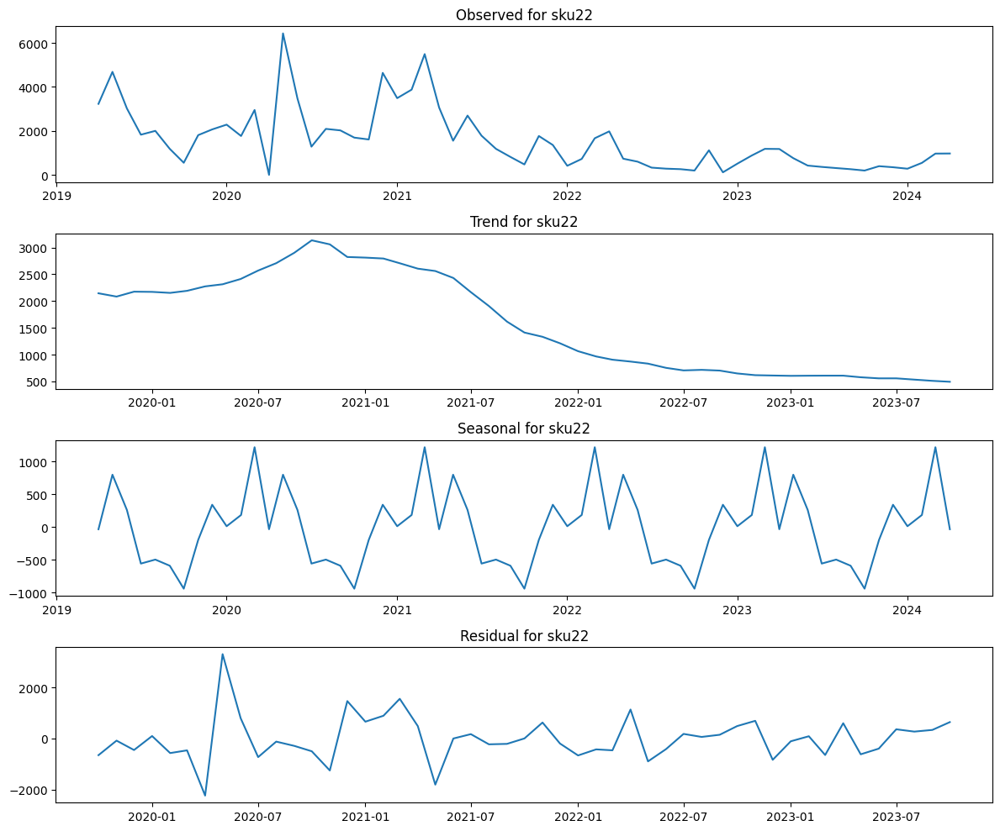

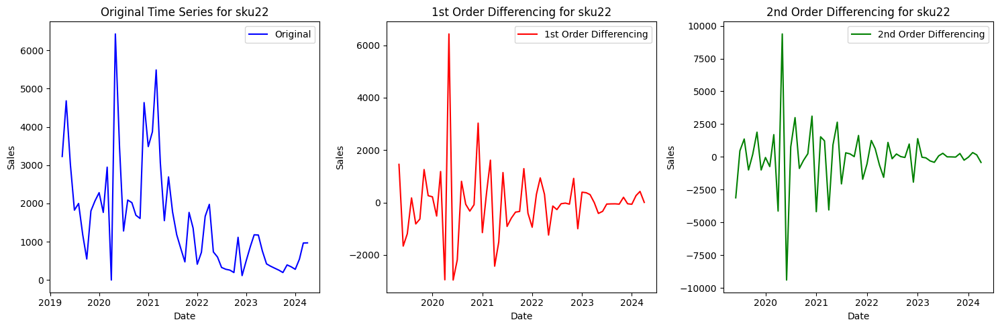

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:43,307 - INFO - ARIMA(1, 1, 1) fitted successfully for sku22
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku22:
ADF Statistic: -2.43164599786125
p-value: 0.13300301117683705
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku22:
ADF Statistic: -8.865398952506382
p-value: 1.4450465773037844e-14
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku22:
ADF Statistic: -6.535615841014816
p-value: 9.625716222233118e-09
Critical Values:
   1%: -3.5778480370438146
   5%: -2.925338105429433
   10%: -2.6007735310095064
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:43,484 - INFO - ARIMA(2, 2, 1) fitted successfully for sku22
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.26170D+01    |proj g|=  7.29820D-01

At iterate    5    f=  1.25326D+01    |proj g|=  3.69516D-01

At iterate   10    f=  8.99829D+00    |proj g|=  4.70609D-03

At iterate   15    f=  8.82851D+00    |proj g|=  4.83682D-05
  ys=-1.402E-01  -gs= 3.770E-04 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     19     42      1     1     0   6.503D-06   8.658D+00
  F =   8.6582837591201809     

CONVERGENCE: NORM

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: 

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.65614D+02    |proj g|=  1.49655D+02

At iterate    5    f=  8.64805D+01    |proj g|=  1.31111D+01

At iterate   10    f=  6.46964D+01    |proj g|=  1.06899D+00

At iterate   15    f=  1.48784D+01    |proj g|=  2.68554D+00

At iterate   20    f=  7.42699D+00    |proj g|=  6.14178D-01

At iterate   25    f=  6.80421D+00    |proj g|=  4.86273D-02


/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys 


At iterate   30    f=  6.80057D+00    |proj g|=  1.32498D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     31      1     0     0   1.325D-06   6.801D+00
  F =   6.8005668194670852     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.89543D+00    |proj g|=  4.73975D-02

At iterate    5    f=  6.89349D+00    |proj g|=  3.44452D-05

           * * *

Tit   = total number of iterations
Tnf   = total nu

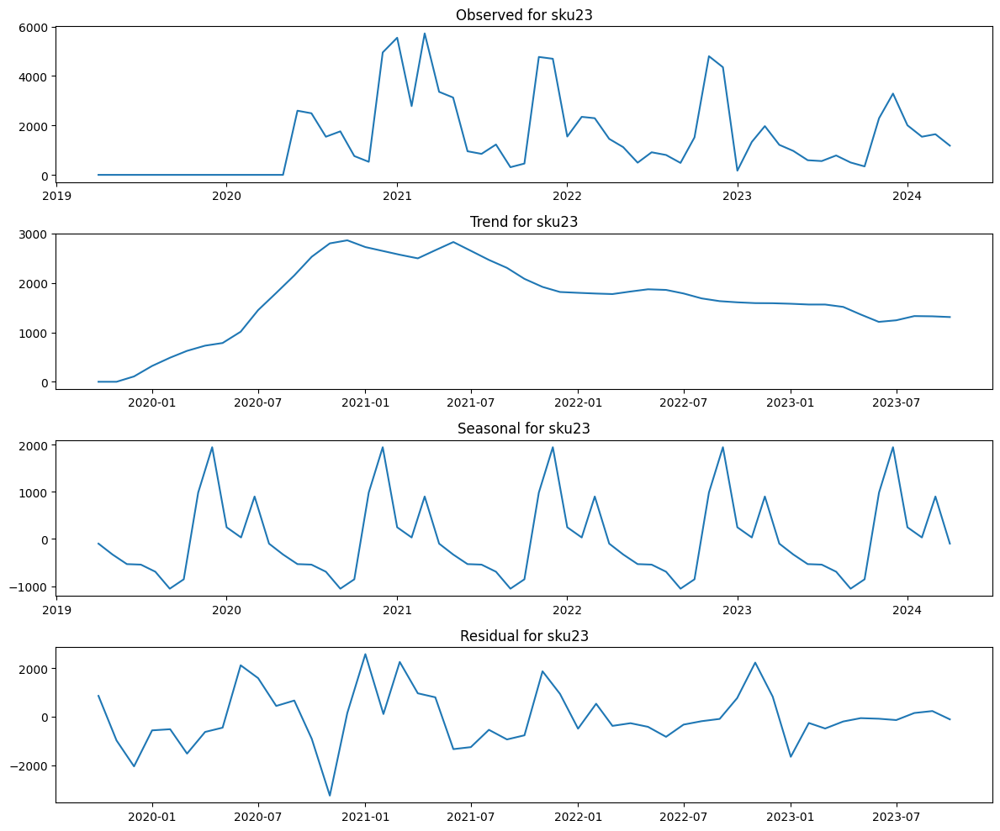

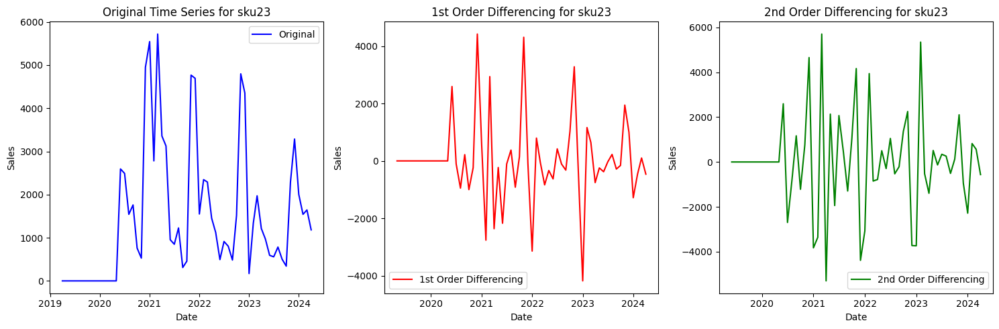

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:45,689 - INFO - ARIMA(1, 1, 1) fitted successfully for sku23
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku23:
ADF Statistic: -4.0527538472271605
p-value: 0.0011581221391504378
Critical Values:
   1%: -3.5443688564814813
   5%: -2.9110731481481484
   10%: -2.5931902777777776
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 1st Differenced Series for sku23:
ADF Statistic: -8.49178724776888
p-value: 1.3074901743355514e-13
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku23:
ADF Statistic: -4.772228786721535
p-value: 6.144415047765363e-05
Critical Values:
   1%: -3.5778480370438146
   5%: -2.925338105429433
   10%: -2.6007735310095064
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:45,891 - INFO - ARIMA(2, 2, 2) fitted successfully for sku23
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.02934D+00    |proj g|=  1.09828D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      4      9      1     0     0   5.554D-05   8.989D+00
  F =   8.9892768667563949     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.1

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.



At iterate   20    f=  7.05268D+00    |proj g|=  1.92024D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     23     24      1     0     0   3.228D-06   7.030D+00
  F =   7.0304786633593030     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.04991D+02    |proj g|=  6.04718D+01

At iterate    5    f=  5.28339D+01    |proj g|=  1.02868D+00

At iterate   10    f=  3.78338D+01    |proj g|=  8.03028D+00


/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.



At iterate   15    f=  1.05605D+01    |proj g|=  3.08005D-02

At iterate   20    f=  7.21187D+00    |proj g|=  2.12360D-01

At iterate   25    f=  7.01294D+00    |proj g|=  9.52201D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     31      1     0     0   7.227D-06   7.013D+00
  F =   7.0126776649141389     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.14194D+00    |proj g|=  5.24240D-02

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible


At iterate   20    f=  7.05097D+00    |proj g|=  4.51740D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     22     26      1     0     0   4.903D-06   7.051D+00
  F =   7.0509669713624907     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.27897D+00    |proj g|=  1.18126D+00

At iterate    5    f=  7.54156D+00    |proj g|=  2.17017D-02

At iterate   10    f=  7.50059D+00    |proj g|=  1.46554D-03

At iter

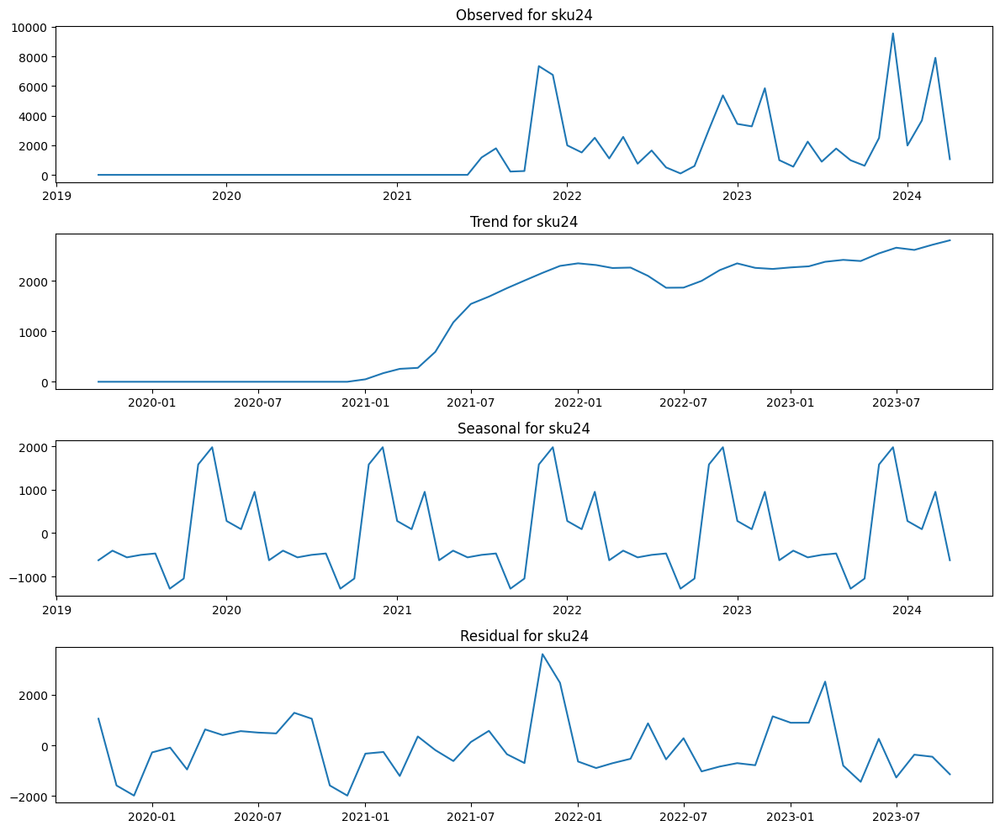

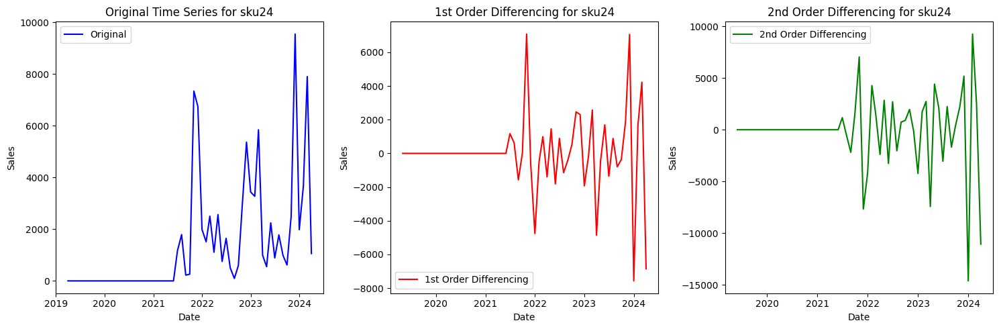

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:48,332 - INFO - ARIMA(1, 1, 1) fitted successfully for sku24
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku24:
ADF Statistic: -0.5427234178920046
p-value: 0.8834062507737174
Critical Values:
   1%: -3.5714715250448363
   5%: -2.922629480573571
   10%: -2.5993358475635153
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku24:
ADF Statistic: -5.436597333480866
p-value: 2.836513752192963e-06
Critical Values:
   1%: -3.5714715250448363
   5%: -2.922629480573571
   10%: -2.5993358475635153
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku24:
ADF Statistic: -4.544467445793044
p-value: 0.00016329071801364452
Critical Values:
   1%: -3.5778480370438146
   5%: -2.925338105429433
   10%: -2.6007735310095064
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:48,553 - INFO - ARIMA(2, 2, 1) fitted successfully for sku24
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.86580D+00    |proj g|=  2.56314D-01

At iterate    5    f=  8.81552D+00    |proj g|=  4.84612D-04

At iterate   10    f=  8.81546D+00    |proj g|=  8.38312D-03

At iterate   15    f=  8.80907D+00    |proj g|=  7.68892D-02

At iterate   20    f=  8.78497D+00    |proj g|=  3.87155D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     22     26      1     0     0   1.530D-05   8.785D+00
  F =   8.7849704746347559     

CONVERG

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.80402D+00    |proj g|=  7.24956D-02

At iterate    5    f=  8.79942D+00    |proj g|=  1.50492D-04

At iterate   10    f=  8.79940D+00    |proj g|=  4.27604D-03

At iterate   15    f=  8.79764D+00    |proj g|=  4.81014D-02

At iterate   20    f=  8.78499D+00    |proj g|=  9.09754D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     22     24      1     0     0   2.167D-08   8.785D+00
  F =   8.7849930461897827     

CONVERG

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.



At iterate    0    f=  6.99575D+00    |proj g|=  2.13239D-01

At iterate    5    f=  6.93756D+00    |proj g|=  1.26529D-04

At iterate   10    f=  6.93731D+00    |proj g|=  7.75942D-03

At iterate   15    f=  6.90201D+00    |proj g|=  1.34712D-03

At iterate   20    f=  6.90152D+00    |proj g|=  2.63656D-04

At iterate   25    f=  6.90012D+00    |proj g|=  4.24952D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     29     46      1     0     0   1.527D-06   6.899D+00
  F =   6.8990103598778827     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machin

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/st


At iterate    5    f=  6.92152D+00    |proj g|=  1.00038D-04

At iterate   10    f=  6.92147D+00    |proj g|=  3.37596D-03

At iterate   15    f=  6.91539D+00    |proj g|=  4.42535D-02

At iterate   20    f=  6.90327D+00    |proj g|=  6.74333D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     21     23      1     0     0   7.448D-07   6.903D+00
  F =   6.9032721040659268     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iter

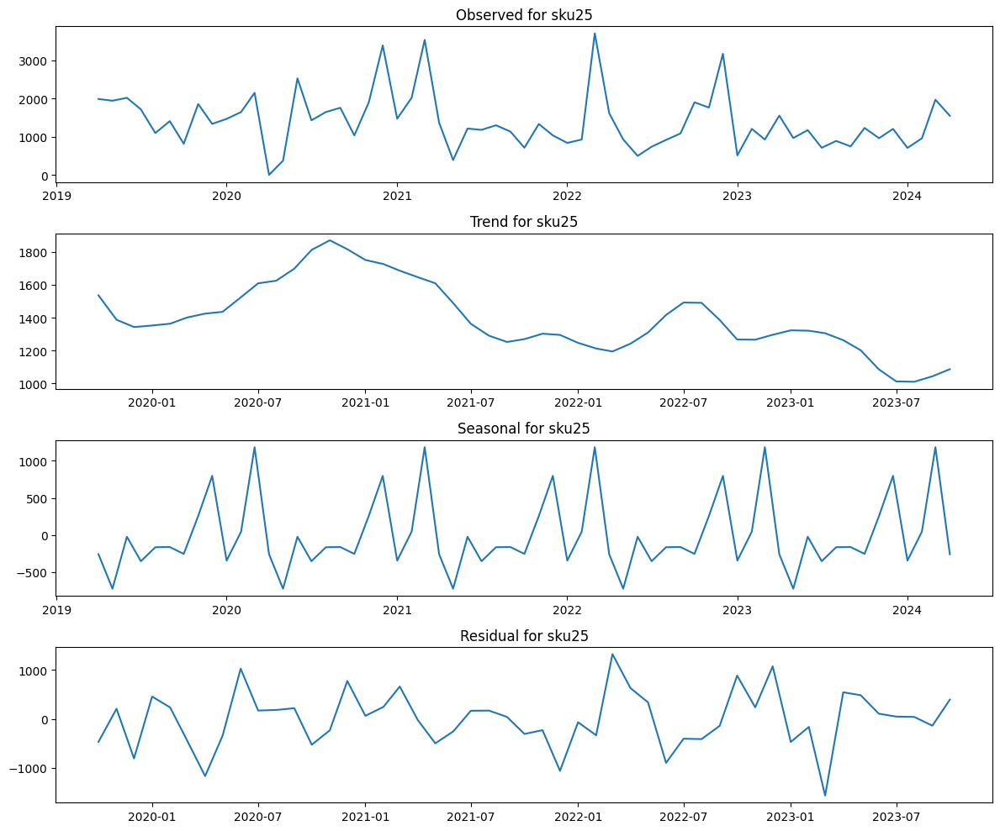

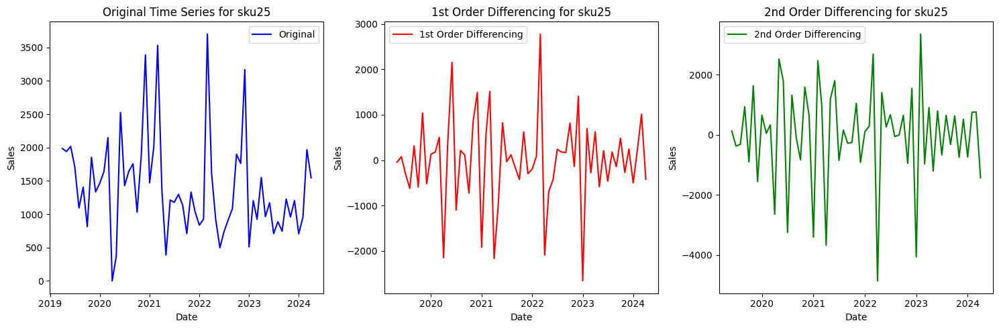

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:51,238 - INFO - ARIMA(1, 1, 1) fitted successfully for sku25
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku25:
ADF Statistic: -2.989427543533478
p-value: 0.03589360039138686
Critical Values:
   1%: -3.5656240522121956
   5%: -2.920142229157715
   10%: -2.598014675124952
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 1st Differenced Series for sku25:
ADF Statistic: -3.574894478691179
p-value: 0.006259533495823299
Critical Values:
   1%: -3.5714715250448363
   5%: -2.922629480573571
   10%: -2.5993358475635153
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku25:
ADF Statistic: -7.684000179871907
p-value: 1.4781473247612988e-11
Critical Values:
   1%: -3.5656240522121956
   5%: -2.920142229157715
   10%: -2.598014675124952
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:51,428 - INFO - ARIMA(2, 2, 1) fitted successfully for sku25
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.90183D+00    |proj g|=  1.12882D+00

At iterate    5    f=  8.57722D+00    |proj g|=  5.17668D-05

At iterate   10    f=  8.57721D+00    |proj g|=  9.13129D-04

At iterate   15    f=  8.57631D+00    |proj g|=  3.94860D-03

At iterate   20    f=  8.57559D+00    |proj g|=  5.92131D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     24     27      1     0     0   7.069D-06   8.576D+00
  F =   8.5755212396535470     

CONVERG

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: 


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      4      6      1     0     0   2.614D-05   8.381D+00
  F =   8.3808106767892223     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.93579D+00    |proj g|=  3.26406D+00

At iterate    5    f=  7.70710D+00    |proj g|=  6.48227D-02

At iterate   10    f=  7.13289D+00    |proj g|=  8.60043D-03

At iterate   15    f=  6.34447D+00    |proj g|=  1.86344D-04

       

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.



At iterate    5    f=  7.84264D+00    |proj g|=  6.26657D-02

At iterate   10    f=  7.48328D+00    |proj g|=  1.28048D-02

At iterate   15    f=  6.36600D+00    |proj g|=  4.86937D-02

At iterate   20    f=  6.34012D+00    |proj g|=  3.94744D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     25      1     0     0   7.628D-06   6.340D+00
  F =   6.3401156596410795     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency infor


At iterate   20    f=  6.41058D+00    |proj g|=  6.59508D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     20     23      1     0     0   6.595D-06   6.411D+00
  F =   6.4105816084583012     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


/home/pratik/.local/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  results_df.loc[sku, 'May_2024_Forecast'] = forecast[1]  # Take the second prediction (May)
2024-07-25 12:29:53,213 - INFO - Processing sku26...


Forecast after differencing adjustment: 2024-05-01    1065.33714
2024-06-01    1040.00898
Freq: MS, Name: predicted_mean, dtype: float64


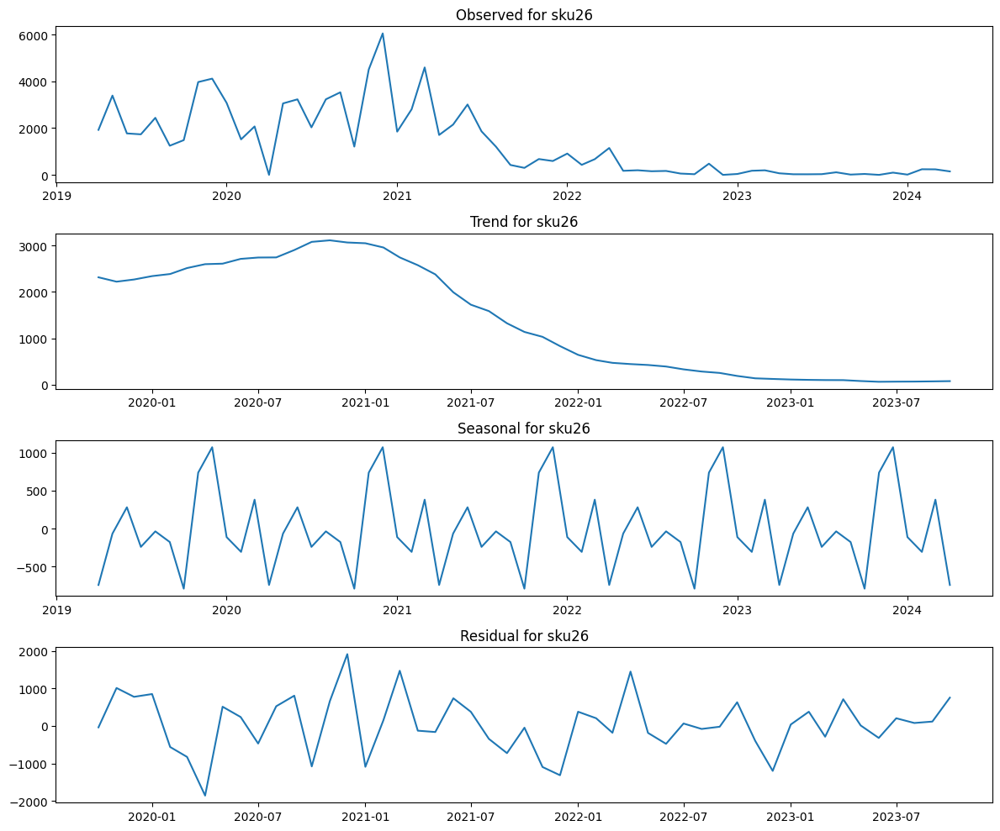

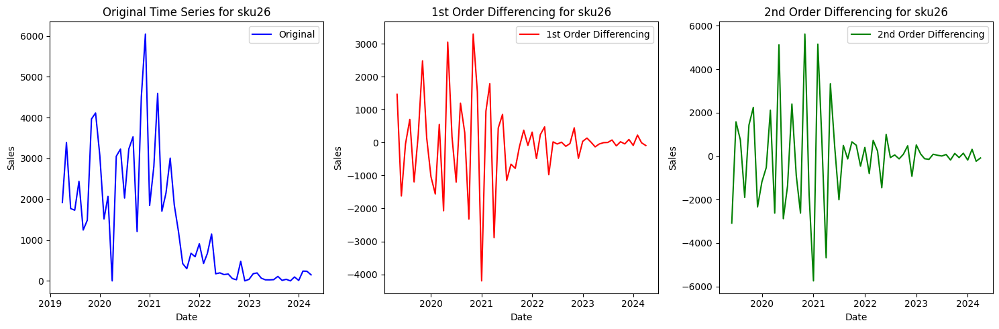

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:54,436 - INFO - ARIMA(1, 1, 1) fitted successfully for sku26
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku26:
ADF Statistic: -0.6661000778396784
p-value: 0.8553360961847598
Critical Values:
   1%: -3.5552728880540942
   5%: -2.9157312396694217
   10%: -2.5956695041322315
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku26:
ADF Statistic: -12.144562811988004
p-value: 1.6219010723731414e-22
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku26:
ADF Statistic: -3.9773010126647343
p-value: 0.0015341466335726125
Critical Values:
   1%: -3.5778480370438146
   5%: -2.925338105429433
   10%: -2.6007735310095064
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:54,655 - INFO - ARIMA(2, 2, 1) fitted successfully for sku26
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.26218D+01    |proj g|=  1.48342D+01

At iterate    5    f=  1.83367D+01    |proj g|=  9.61516D-02

At iterate   10    f=  9.31571D+00    |proj g|=  4.40502D-03

At iterate   15    f=  8.64706D+00    |proj g|=  6.77728D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     17     21      1     0     0   1.140D-06   8.646D+00
  F =   8.6457396623771245     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: 

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.83030D+00    |proj g|=  1.58537D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      3      6      1     0     0   6.622D-06   6.816D+00
  F =   6.8164309124759539     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.5

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency infor


At iterate   10    f=  6.76435D+00    |proj g|=  3.92567D-02

At iterate   15    f=  6.76076D+00    |proj g|=  1.60430D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     17     22      1     0     0   1.878D-07   6.761D+00
  F =   6.7607608496596097     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Forecast after differencing adjustment: 2024-05-01    149.490732
2024-06-01     14.843675
Freq: MS, Name: predicted_mean, dtype: float64


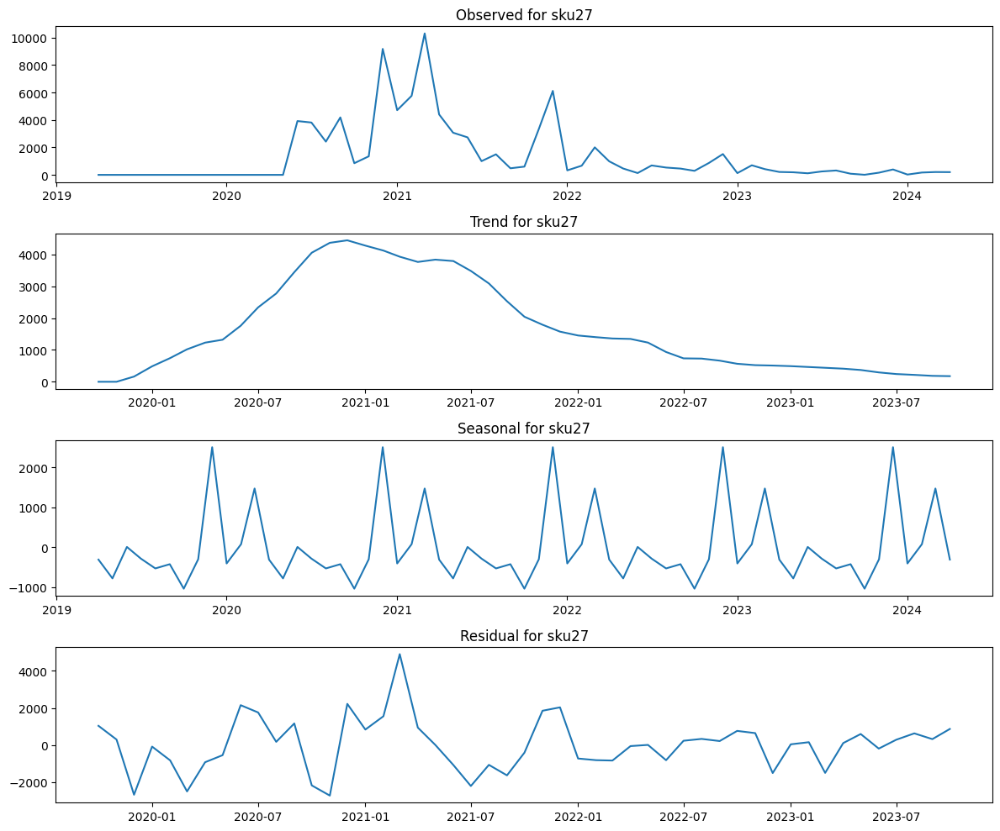

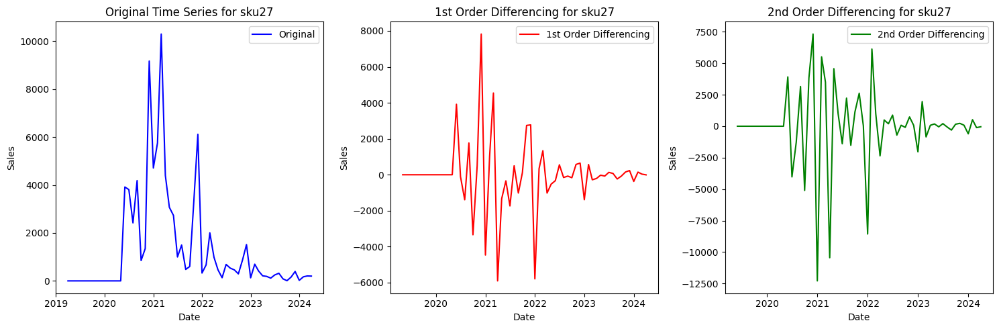

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:56,948 - INFO - ARIMA(1, 1, 1) fitted successfully for sku27
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku27:
ADF Statistic: -2.5031798496230024
p-value: 0.11470254884826248
Critical Values:
   1%: -3.5506699942762414
   5%: -2.913766394626147
   10%: -2.5946240473991997
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku27:
ADF Statistic: -4.946914355876829
p-value: 2.8237454828466615e-05
Critical Values:
   1%: -3.552928203580539
   5%: -2.9147306250000002
   10%: -2.595137155612245
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku27:
ADF Statistic: -6.039655724627387
p-value: 1.3555565316306412e-07
Critical Values:
   1%: -3.5656240522121956
   5%: -2.920142229157715
   10%: -2.598014675124952
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:57,161 - INFO - ARIMA(2, 2, 1) fitted successfully for sku27
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.63742D+01    |proj g|=  7.26379D-01

At iterate    5    f=  1.19297D+01    |proj g|=  2.03774D+00

At iterate   10    f=  9.10685D+00    |proj g|=  4.13831D-02

At iterate   15    f=  9.02454D+00    |proj g|=  1.01248D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     16     25      1     0     0   3.837D-06   9.025D+00
  F =   9.0245330863132658     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: 


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      4      6      1     0     0   9.825D-05   9.040D+00
  F =   9.0399096462510080     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.57718D+01    |proj g|=  2.87540D+01

At iterate    5    f=  2.33746D+01    |proj g|=  6.32004D-01

At iterate   10    f=  1.90243D+01    |proj g|=  8.58409D-02

At iterate   15    f=  8.09793D+00    |proj g|=  4.02504D-03

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.



At iterate   15    f=  1.24512D+01    |proj g|=  8.01012D-02

At iterate   20    f=  7.42023D+00    |proj g|=  5.33012D-02

At iterate   25    f=  7.06603D+00    |proj g|=  1.38458D-03

At iterate   30    f=  7.06324D+00    |proj g|=  6.03508D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     35      1     0     0   6.035D-06   7.063D+00
  F =   7.0632421546091093     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys 


At iterate   10    f=  7.23031D+00    |proj g|=  1.02835D-01

At iterate   15    f=  7.17851D+00    |proj g|=  1.05146D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     19     25      1     0     0   2.324D-07   7.178D+00
  F =   7.1781823313541357     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.97557D+00    |proj g|=  5.73538D-02

At iterate    5    f=  8.97364D+00    |proj g|=  3.70769D-04

At iter

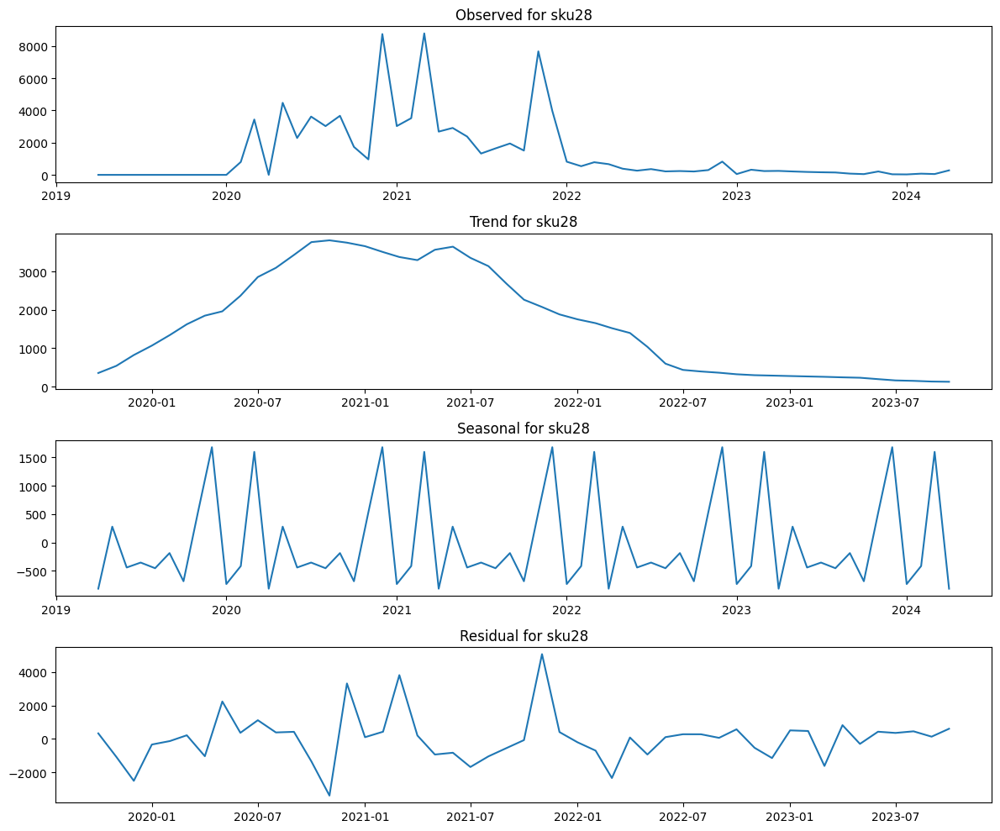

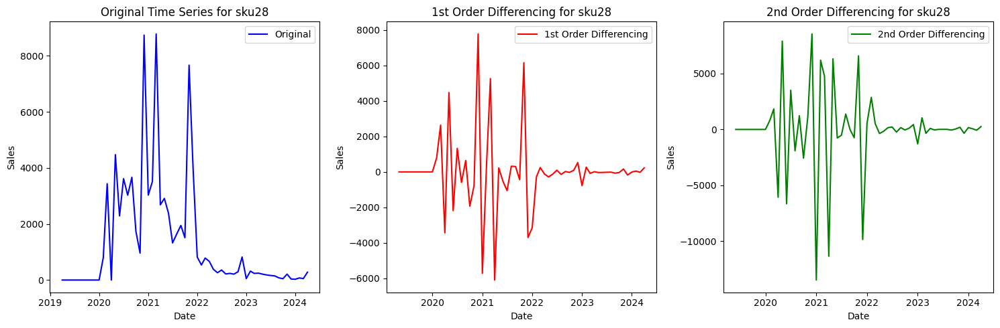

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:29:59,911 - INFO - ARIMA(1, 1, 1) fitted successfully for sku28
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku28:
ADF Statistic: -1.8666744865030398
p-value: 0.3478971587138676
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku28:
ADF Statistic: -10.244573004357033
p-value: 4.6538530320013014e-18
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku28:
ADF Statistic: -4.602866790326058
p-value: 0.0001276071486630926
Critical Values:
   1%: -3.5745892596209488
   5%: -2.9239543084490744
   10%: -2.6000391840277777
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:30:00,094 - INFO - ARIMA(2, 2, 1) fitted successfully for sku28
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.85973D+01    |proj g|=  3.59353D+00

At iterate    5    f=  4.84809D+01    |proj g|=  1.87425D+00

At iterate   10    f=  4.39925D+01    |proj g|=  1.92259D+01

At iterate   15    f=  1.26520D+01    |proj g|=  1.17795D-01

At iterate   20    f=  9.59531D+00    |proj g|=  4.74545D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     24     26      1     0     0   5.114D-06   9.468D+00
  F =   9.4680138574957287     

CONVERG

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.16988D+02    |proj g|=  5.34213D+02

At iterate    5    f=  2.17792D+02    |proj g|=  7.92927D+00

At iterate   10    f=  7.88348D+01    |proj g|=  9.44373D-01

At iterate   15    f=  1.57878D+01    |proj g|=  4.69274D-02

At iterate   20    f=  7.80679D+00    |proj g|=  2.15997D-03

At iterate   25    f=  7.16763D+00    |proj g|=  4.06597D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     26     27      1     0     0   

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:47

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.28367D+00    |proj g|=  2.79921D-02

At iterate    5    f=  7.28247D+00    |proj g|=  1.14757D-04

At iterate   10    f=  7.28245D+00    |proj g|=  4.18362D-03

At iterate   15    f=  7.27970D+00    |proj g|=  4.43627D-02


/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  results_df.loc[sku, 'May_2024_Forecast'] = forecast[1]  # Take the second prediction (May)


At iterate   20    f=  7.27101D+00    |proj g|=  8.29794D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     23     26      1     0     0   1.196D-05   7.271D+00
  F =   7.2710029796058766     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Forecast after differencing adjustment: 2024-05-01    14.783704
2024-06-01    75.841211
Freq: MS, Name: predicted_mean, dtype: float64


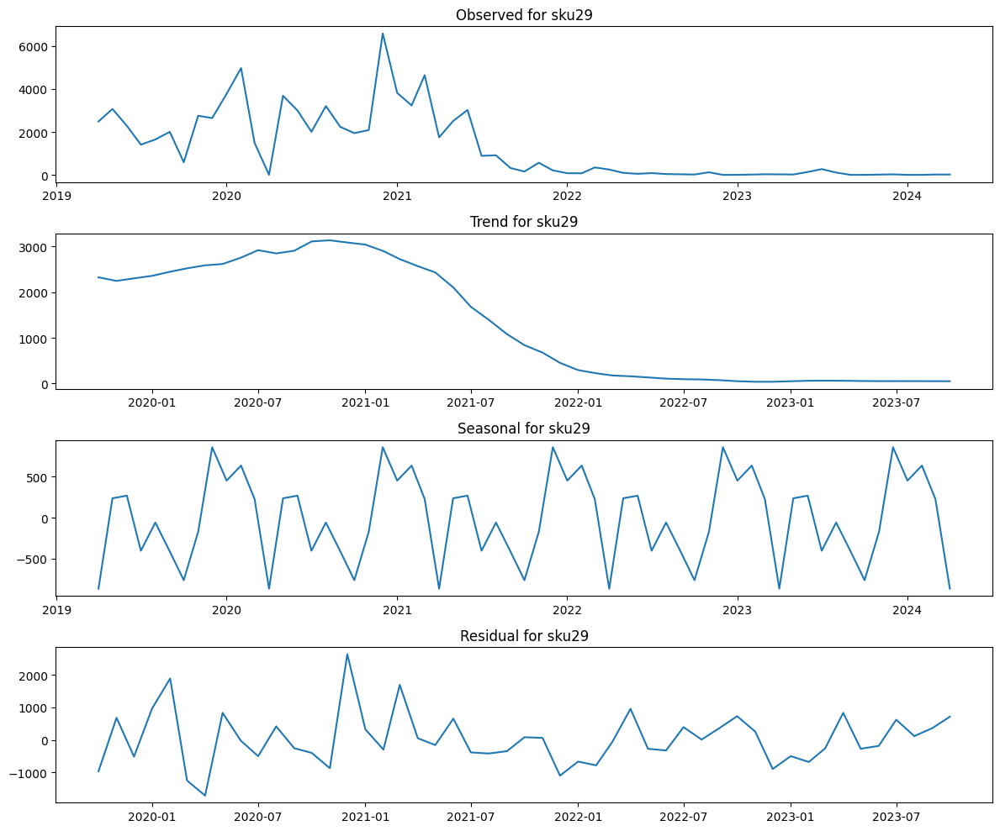

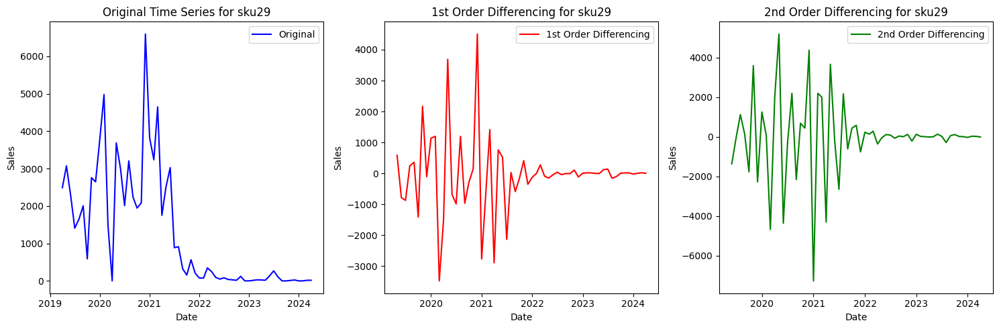

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:30:02,451 - INFO - ARIMA(1, 1, 1) fitted successfully for sku29
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku29:
ADF Statistic: -1.4253446470789974
p-value: 0.5700670859922623
Critical Values:
   1%: -3.548493559596539
   5%: -2.912836594776334
   10%: -2.594129155766944
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku29:
ADF Statistic: -3.288265734691087
p-value: 0.01541121406157437
Critical Values:
   1%: -3.568485864
   5%: -2.92135992
   10%: -2.5986616
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku29:
ADF Statistic: -4.426302057444065
p-value: 0.0002665838890460637
Critical Values:
   1%: -3.5778480370438146
   5%: -2.925338105429433
   10%: -2.6007735310095064
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:30:02,631 - INFO - ARIMA(2, 2, 1) fitted successfully for sku29
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.61619D+02    |proj g|=  1.37267D+01

At iterate    5    f=  1.26931D+02    |proj g|=  5.34284D+01

At iterate   10    f=  2.20257D+01    |proj g|=  6.08000D-01

At iterate   15    f=  9.41553D+00    |proj g|=  3.99308D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     19     22      1     0     0   3.685D-06   8.790D+00
  F =   8.7900270649944989     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: 


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     23     24      1     0     0   2.570D-06   6.714D+00
  F =   6.7135166953138885     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.07885D+01    |proj g|=  6.64178D+01

At iterate    5    f=  4.10588D+01    |proj g|=  6.76877D-01

At iterate   10    f=  2.08642D+01    |proj g|=  1.42876D+00


 This problem is unconstrained.



At iterate   15    f=  8.12382D+00    |proj g|=  8.46742D-02

At iterate   20    f=  6.73558D+00    |proj g|=  3.62428D-02

At iterate   25    f=  6.70912D+00    |proj g|=  1.73861D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     28      1     0     0   1.602D-06   6.709D+00
  F =   6.7091163351898446     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.92716D+00    |proj g|=  2.49345D-01

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys 


At iterate   15    f=  6.87133D+00    |proj g|=  1.00892D-01

At iterate   20    f=  6.80461D+00    |proj g|=  8.43608D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     23     25      1     0     0   2.754D-06   6.805D+00
  F =   6.8046055106598784     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.52256D+00    |proj g|=  5.66797D-03

           * * *

Tit   = total number of iterations
Tnf   = total nu

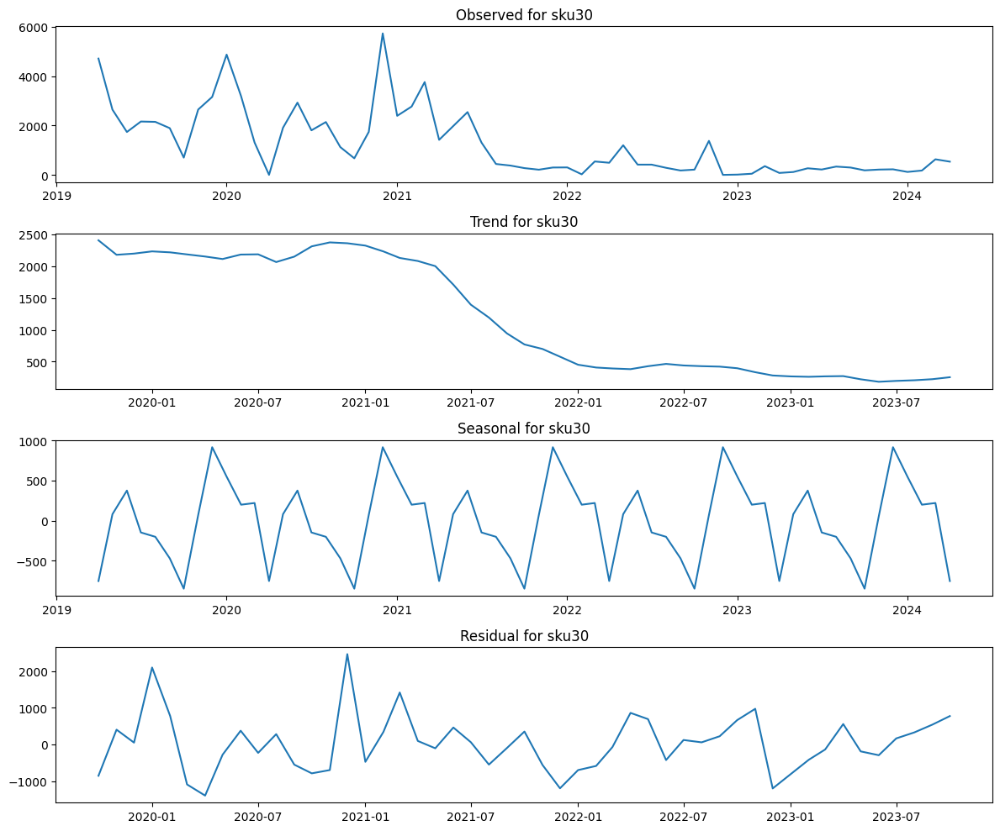

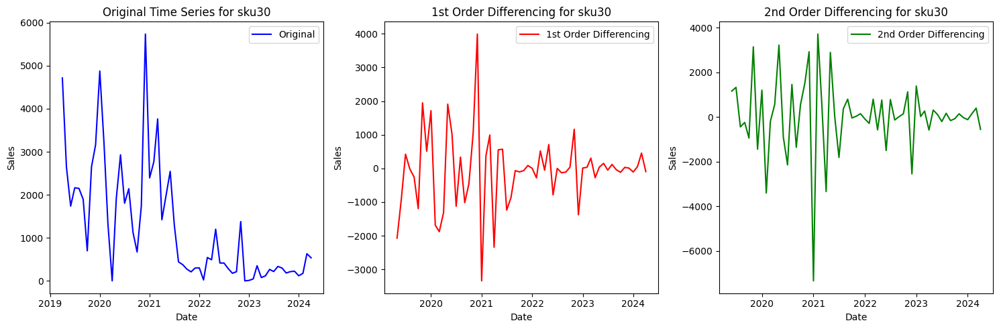

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:30:05,158 - INFO - ARIMA(1, 1, 1) fitted successfully for sku30
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku30:
ADF Statistic: -1.7364385095960178
p-value: 0.4124427482938715
Critical Values:
   1%: -3.568485864
   5%: -2.92135992
   10%: -2.5986616
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku30:
ADF Statistic: -3.5446892254587503
p-value: 0.006910873537930979
Critical Values:
   1%: -3.568485864
   5%: -2.92135992
   10%: -2.5986616
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku30:
ADF Statistic: -4.051023636356678
p-value: 0.001165683367814388
Critical Values:
   1%: -3.5714715250448363
   5%: -2.922629480573571
   10%: -2.5993358475635153
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
2024-07-25 12:30:05,333 - INFO - ARIMA(2, 1, 1) fitted successfully for sku30
/home/pratik/.local/lib/python3.10/site-packages/statsm

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.04051D+01    |proj g|=  2.62706D-01

At iterate    5    f=  9.79930D+00    |proj g|=  4.28613D-01

At iterate   10    f=  8.71599D+00    |proj g|=  1.57788D-02

At iterate   15    f=  8.47895D+00    |proj g|=  1.62469D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     16     28      1     0     0   6.934D-06   8.479D+00
  F =   8.4789488374547322     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: 


At iterate    5    f=  8.38866D+00    |proj g|=  8.89863D-02

At iterate   10    f=  8.11528D+00    |proj g|=  9.77961D-03

At iterate   15    f=  6.69829D+00    |proj g|=  4.28434D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     19     20      1     0     0   1.129D-06   6.660D+00
  F =   6.6599414998563073     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.15443D+01    |proj g|=  3.65545D+00

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate   10    f=  8.50473D+00    |proj g|=  1.32355D-02

At iterate   15    f=  7.10577D+00    |proj g|=  1.57696D-02

At iterate   20    f=  6.65438D+00    |proj g|=  9.88689D-03

At iterate   25    f=  6.65365D+00    |proj g|=  8.19789D-08

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     27      1     0     0   8.198D-08   6.654D+00
  F =   6.6536528448919627     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/tmp/ipykernel_49161/2958271255.py:127: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  results_df.loc[sku, 'May_2024_Forecast'] = forecast[1]  # Take the second prediction (May)


At iterate   15    f=  6.82839D+00    |proj g|=  9.53230D-02

At iterate   20    f=  6.75568D+00    |proj g|=  3.37826D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     22     25      1     0     0   2.904D-06   6.756D+00
  F =   6.7556805783599341     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
Forecast after differencing adjustment: 2024-05-01    139.952231
2024-06-01    259.431848
Freq: MS, Name: predicted_mean, dtype: float64


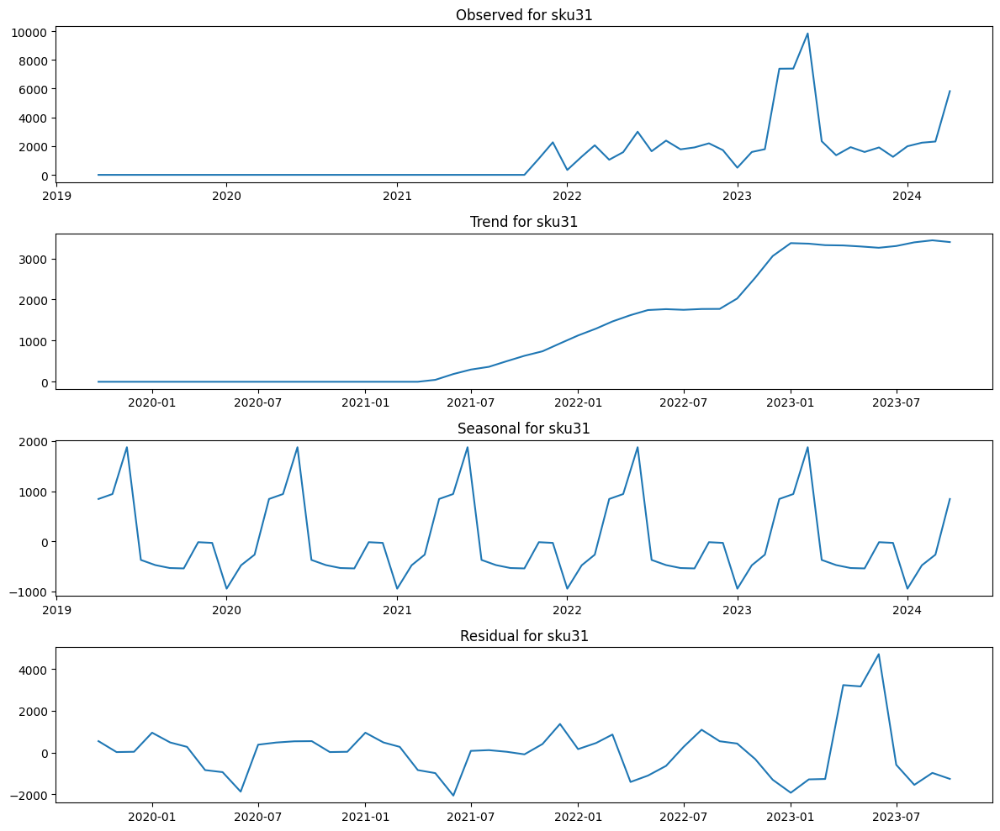

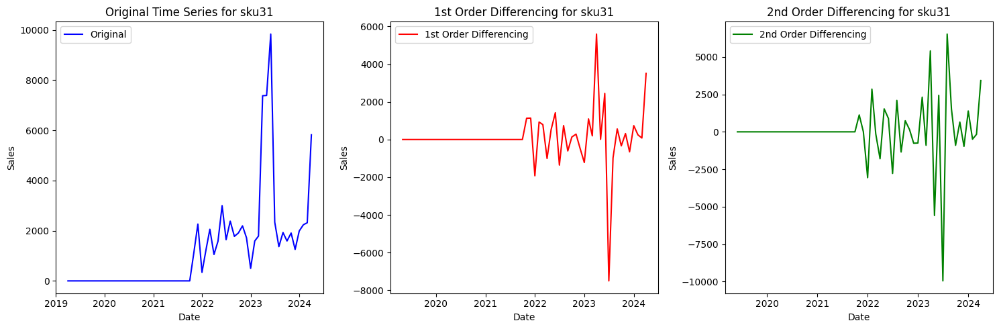

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
2024-07-25 12:30:07,779 - INFO - ARIMA(1, 1, 1) fitted successfully for sku31
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_

ADF Test for Original Series for sku31:
ADF Statistic: -2.5952315088412803
p-value: 0.09398682813712433
Critical Values:
   1%: -3.5443688564814813
   5%: -2.9110731481481484
   10%: -2.5931902777777776
Weak evidence against null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary

ADF Test for 1st Differenced Series for sku31:
ADF Statistic: -5.02615322100266
p-value: 1.969470691396802e-05
Critical Values:
   1%: -3.5656240522121956
   5%: -2.920142229157715
   10%: -2.598014675124952
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary

ADF Test for 2nd Differenced Series for sku31:
ADF Statistic: -5.070066314641478
p-value: 1.609781400294559e-05
Critical Values:
   1%: -3.5745892596209488
   5%: -2.9239543084490744
   10%: -2.6000391840277777
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
2024-07-25 12:30:07,977 - INFO - ARIMA(2, 2, 1) fitted successfully for sku31
/home/pratik/.local/lib/python3.10/site-packag

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.92120D+00    |proj g|=  3.71652D-02

At iterate    5    f=  8.91837D+00    |proj g|=  8.00148D-04

At iterate   10    f=  8.91790D+00    |proj g|=  1.50279D-02

At iterate   15    f=  8.74826D+00    |proj g|=  5.91980D-04

At iterate   20    f=  8.70660D+00    |proj g|=  9.15806D-03

At iterate   25    f=  8.68724D+00    |proj g|=  2.52133D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     26     38      1     0     0   

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.77028D+00    |proj g|=  1.12579D-01

At iterate    5    f=  8.69889D+00    |proj g|=  1.16057D-03

At iterate   10    f=  8.69834D+00    |proj g|=  1.74359D-02

At iterate   15    f=  8.68757D+00    |proj g|=  1.23111D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2     18     21      1     0     0   2.910D-07   8.687D+00
  F =   8.6872581320500313     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:47


At iterate   15    f=  6.85004D+00    |proj g|=  2.27328D-02

At iterate   20    f=  6.80463D+00    |proj g|=  4.18495D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     28      1     0     0   8.852D-06   6.805D+00
  F =   6.8046261128285055     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.82405D+00    |proj g|=  1.15991D-02

At iterate    5    f=  6.82338D+00    |proj g|=  5.13613D-04

At iter

/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/home/pratik/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency infor

Forecast after differencing adjustment: 2024-05-01   -365.628950
2024-06-01    437.821818
Freq: MS, Name: predicted_mean, dtype: float64


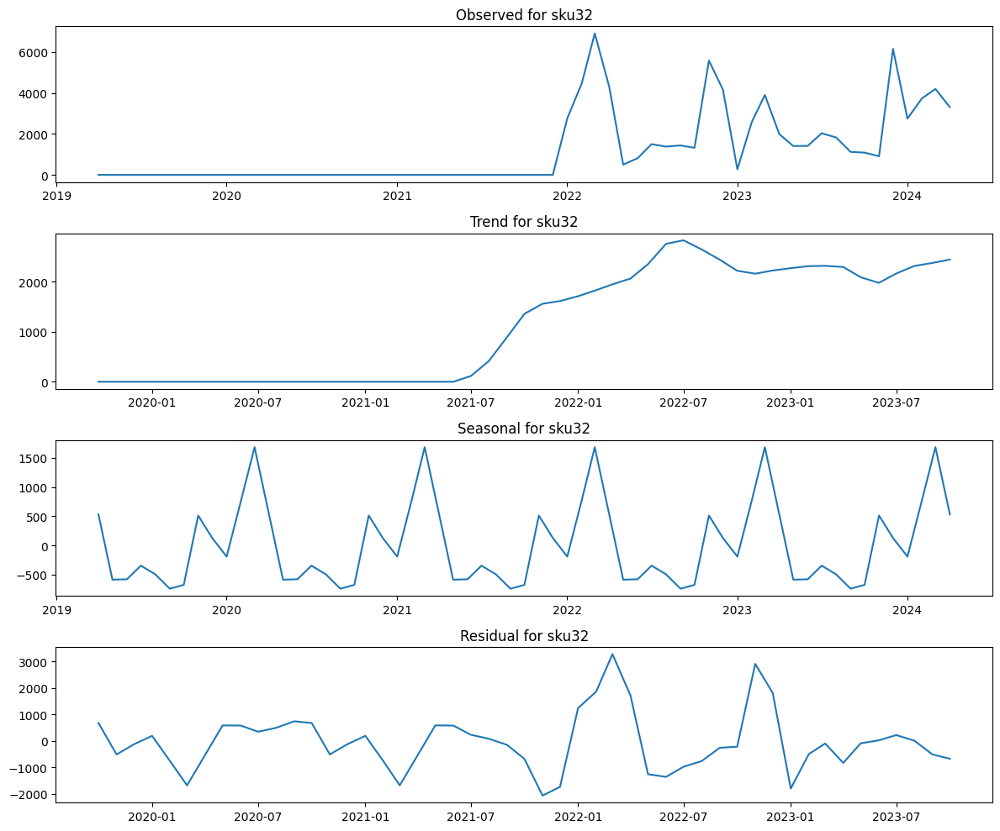

In [ ]:
for sku in skus:
    logging.info(f"Processing {sku}...")

    # Extract time series data for the SKU
    sku_data = data[data['key'] == sku].values.flatten()[1:]
    sku_series = pd.Series(sku_data, index=dates)

    decompose(sku_series, sku)


    # Perform differencing
    diff1, diff2 = plot_differencing(sku_series, sku)

    # Perform ADF test on original and differenced series
    adf_results = {}
    adf_results['Original'] = adf_test(sku_series, f'Original Series for {sku}')
    adf_results['1st_Diff'] = adf_test(diff1, f'1st Differenced Series for {sku}')
    adf_results['2nd_Diff'] = adf_test(diff2, f'2nd Differenced Series for {sku}')

    for series_type, result in adf_results.items():
        results_df.loc[sku, f'ADF_Statistic_{series_type}'] = result['ADF_Statistic']
        results_df.loc[sku, f'p_value_{series_type}'] = result['p_value']
        results_df.loc[sku, f'Stationary_{series_type}'] = result['Stationary']

    # Choose the appropriate series for modeling based on stationarity
    if adf_results['Original']['Stationary'] == 'Yes':
        modeling_series = sku_series
    elif adf_results['1st_Diff']['Stationary'] == 'Yes':
        modeling_series = diff1
    else:
        modeling_series = diff2

    # Split the data
    train = modeling_series[:-7]
    test = modeling_series[-7:-1]
    train = pd.to_numeric(train, errors='coerce').dropna()
    test = pd.to_numeric(test, errors='coerce').dropna()

    arima_results ={}
    # Fit ARIMA models
    for params in arima_params:
        try:
            rmse = fit_arima(train, test, params)
            arima_results[params] = rmse
            results_df.loc[sku, f'ARIMA{params}_RMSE'] = rmse
            logging.info(f"ARIMA{params} fitted successfully for {sku}")
        except Exception as e:
            logging.error(f"Error fitting ARIMA{params} for {sku}: {str(e)}")
            results_df.loc[sku, f'ARIMA{params}_RMSE'] = np.nan

    # Find best ARIMA model

    if arima_results:
        best_arima = min(arima_results, key=arima_results.get)
        results_df.loc[sku, 'Best_ARIMA'] = str(best_arima)
        results_df.loc[sku, 'Best_ARIMA_RMSE'] = arima_results[best_arima]
    else:
        results_df.loc[sku, 'Best_ARIMA'] = 'None'
        results_df.loc[sku, 'Best_ARIMA_RMSE'] = np.nan

    # Fit SARIMAX models
    sarimax_results = {}
    for params in sarimax_params:
        try:
            rmse = fit_sarimax(train, test, params[0], params[1])
            sarimax_results[params] = rmse
            results_df.loc[sku, f'SARIMAX{params}_RMSE'] = rmse
        except:
            results_df.loc[sku, f'SARIMAX{params}_RMSE'] = np.nan

    # Find best SARIMAX model
    if sarimax_results:
        best_sarimax = min(sarimax_results, key=sarimax_results.get)
        results_df.loc[sku, 'Best_SARIMAX'] = str(best_sarimax)
        results_df.loc[sku, 'Best_SARIMAX_RMSE'] = sarimax_results[best_sarimax]
    else:
        results_df.loc[sku, 'Best_SARIMAX'] = 'None'
        results_df.loc[sku, 'Best_SARIMAX_RMSE'] = np.nan

    # Determine overall best model
    if arima_results and sarimax_results:
        if arima_results[best_arima] < sarimax_results[best_sarimax]:
            results_df.loc[sku, 'Best_Model'] = 'ARIMA'
            results_df.loc[sku, 'Best_Model_RMSE'] = arima_results[best_arima]
        else:
            results_df.loc[sku, 'Best_Model'] = 'SARIMAX'
            results_df.loc[sku, 'Best_Model_RMSE'] = sarimax_results[best_sarimax]
    elif arima_results:
        results_df.loc[sku, 'Best_Model'] = 'ARIMA'
        results_df.loc[sku, 'Best_Model_RMSE'] = arima_results[best_arima]
    elif sarimax_results:
        results_df.loc[sku, 'Best_Model'] = 'SARIMAX'
        results_df.loc[sku, 'Best_Model_RMSE'] = sarimax_results[best_sarimax]
    else:
        results_df.loc[sku, 'Best_Model'] = 'None'
        results_df.loc[sku, 'Best_Model_RMSE'] = np.nan

    modeling_series = pd.to_numeric(modeling_series, errors='coerce').dropna()


    # Predict for May 2024
    try:
        if results_df.loc[sku, 'Best_Model'] == 'ARIMA':
            model = ARIMA(modeling_series, order=best_arima)
            results = model.fit()
            forecast = results.forecast(steps=2)  # Predict for 2 months
        elif results_df.loc[sku, 'Best_Model'] == 'SARIMAX':
            model = SARIMAX(modeling_series, order=best_sarimax[0], seasonal_order=best_sarimax[1])
            results = model.fit()
            forecast = results.forecast(steps=2)  # Predict for 2 months
        else:
            forecast = [np.nan, np.nan]
    
        # Check forecast length
        if len(forecast) < 2:
            print("Forecast length is shorter than expected:", forecast)
            forecast = [np.nan, np.nan]
    
        # If we used differenced data, we need to invert the differencing
        if modeling_series is diff1:
            forecast = sku_series.iloc[-1] + forecast.cumsum()
        elif modeling_series is diff2:
            forecast = sku_series.iloc[-1] + diff1.iloc[-1] + forecast.cumsum().cumsum()
    
        print("Forecast after differencing adjustment:", forecast)
    
        results_df.loc[sku, 'May_2024_Forecast'] = forecast[1]  # Take the second prediction (May)
    except Exception as e:
        logging.error(f"Error predicting for {sku}: {str(e)}")
        results_df.loc[sku, 'May_2024_Forecast'] = np.nan
    


# Save results to CSV
results_df.to_csv('time_series_analysis_results.csv')

print("Analysis complete. Results saved to 'time_series_analysis_results.csv'.")